# NETW 1013 Clustering Project

**Objective:**
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers:
* Which clustering approach have you decided to use on each dataset?
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques?






Running this project requires the following imports:

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = "black", marker = 'x', s = 100)

In [4]:
def display_aglo_cluster(X,km=[],num_clusters=0):
    colors = "brgcmyk"
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = colors[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],cmap= "plasma" ,alpha = alpha,s=s)


## Multi Blob Data Set
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



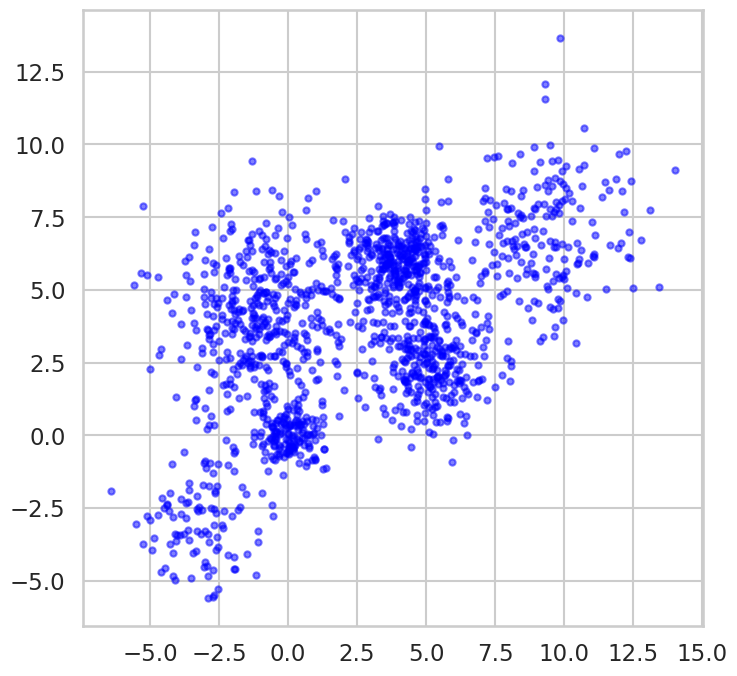

In [ ]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans
* Use Kmeans with different values of K to cluster the above data.
* Display the outcome of each value of K.
* Plot distortion function versus K and choose the approriate value of K.
* Plot the silhouette_score versus K and use it to choose the best K.
* Store the silhouette_score for the best K for later comparison with other clustering techniques.
* Comment on the effect of centroid initialization on cluster assignment.
* Hint: Lookup k-means++ .

In [ ]:
ssd = []
ssd1 = []

for k in range(2,15):

    model = KMeans(n_clusters=k)


    model.fit(Multi_blob_Data)

    ssd.append(model.inertia_)
    labels= model.fit_predict(Multi_blob_Data)

    silhouette=silhouette_score(Multi_blob_Data,labels)
    ssd1.append(silhouette)

Text(0, 0.5, ' Sum of Squared Distances')

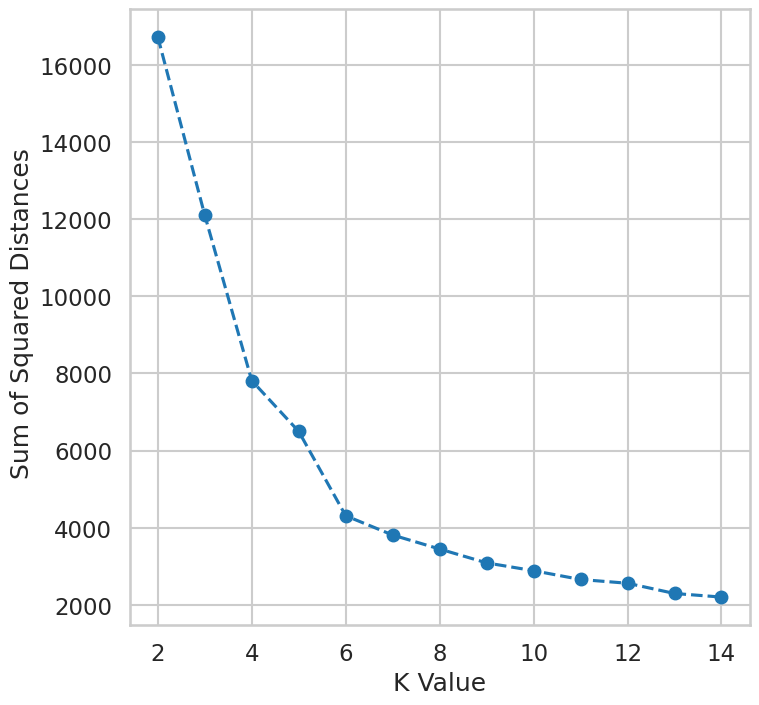

In [ ]:
plt.plot(range(2,15),ssd,'o--')
plt.xlabel("K Value")
plt.ylabel(" Sum of Squared Distances")

Text(0, 0.5, 'Silhouette_score')

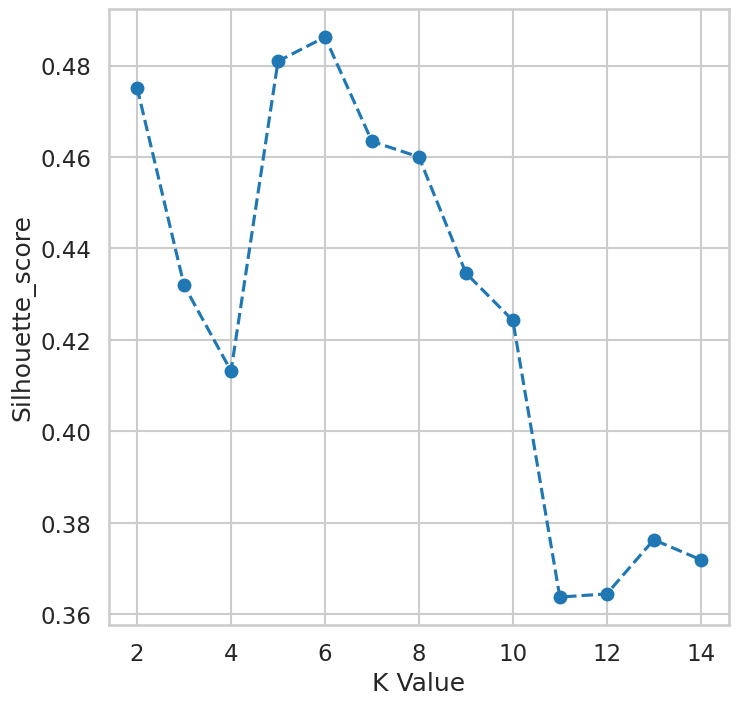

In [ ]:
plt.plot(range(2,15),ssd1,'o--')
plt.xlabel("K Value")
plt.ylabel("Silhouette_score")

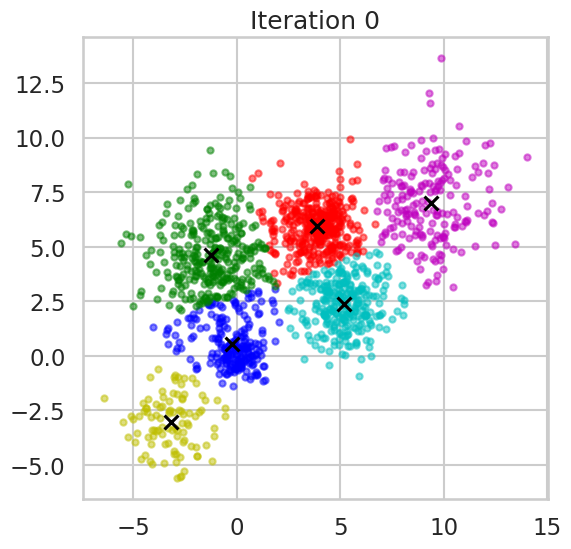

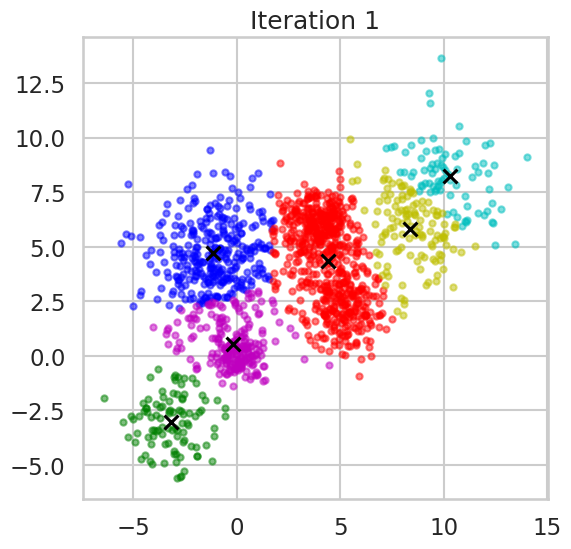

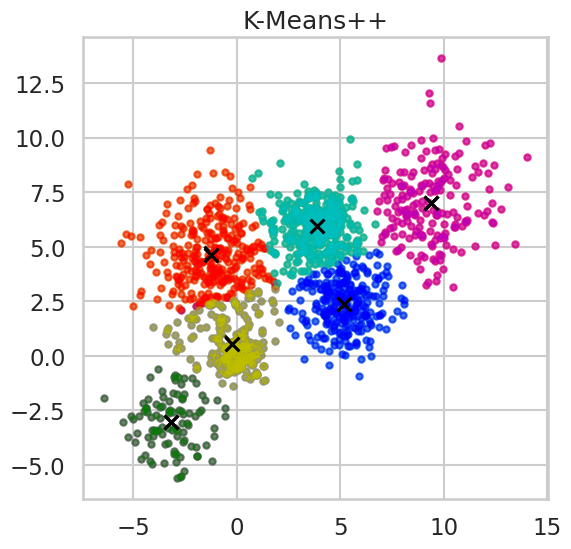


List of Initial Centroids for Each k:
[[-0.22841644  0.52884939]
 [ 3.85392481  5.9328261 ]
 [-1.25319383  4.63140964]
 [ 5.18118901  2.3624744 ]
 [ 9.36856474  7.00625988]
 [-3.16735394 -3.03549079]]

[[-1.15497719  4.73950275]
 [ 4.40635923  4.34650381]
 [-3.16735394 -3.03549079]
 [10.27732747  8.25764495]
 [-0.19917871  0.53901354]
 [ 8.38992649  5.82040346]]

[[-0.27312711  0.61311115]
 [ 9.36856474  7.00625988]
 [ 3.84811823  5.92599202]
 [ 5.18118901  2.3624744 ]
 [-3.16735394 -3.03549079]
 [-1.26279662  4.70895346]]

K-Means++ initialization [[-0.27312711  0.61311115]
 [ 9.36856474  7.00625988]
 [ 3.84811823  5.92599202]
 [ 5.18118901  2.3624744 ]
 [-3.16735394 -3.03549079]
 [-1.26279662  4.70895346]]
Silhouette_score_kmeans 0.4852844732625266


In [ ]:
import random
s=[]

for i in range(3):
    rand_int = random.randint(1, 100)
    model = KMeans(n_clusters=6, random_state=rand_int)
    model.fit(Multi_blob_Data)
    plt.figure(figsize=(6,6))
    display_cluster(Multi_blob_Data,model,6)
    title = "Iteration " + str(i)
    plt.title(title)
    s.append(model.cluster_centers_)

kmeans = KMeans(n_clusters=6, init='k-means++', random_state=42)
kmeans.fit(Multi_blob_Data)
display_cluster(Multi_blob_Data,kmeans,6)
labels= model.fit_predict(Multi_blob_Data)
silhouette_score_kmeans=silhouette_score(Multi_blob_Data,labels)
plt.title('K-Means++')
plt.show()
print("\nList of Initial Centroids for Each k:")
for centroids in s:
    print(centroids)
    print()
print("K-Means++ initialization",model.cluster_centers_)
print("Silhouette_score_kmeans",silhouette_score_kmeans)


###Comments on K-means clustering:

###1. Since the max value of silhouette is around 0.48 at k =6 ->1

###  Using the elbow method in the graph between number of clusters and the sum of squared distances between the centroids and the points in the cluster -> 2
  
###  From 1 & 2 : we can deduce that optimal number of clusters =6

###2. The assignement of the points to the cluster differs in each iteration based on centroids initialization


###3.  if we compare the initialization of the centers and the random initialization using k means algorithms, we can see that kmeans++ give the nearest assignement for the centroids with Silhouette score 0.4853

### Hierarchal Clustering
* Use AgglomerativeClustering function to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observation.

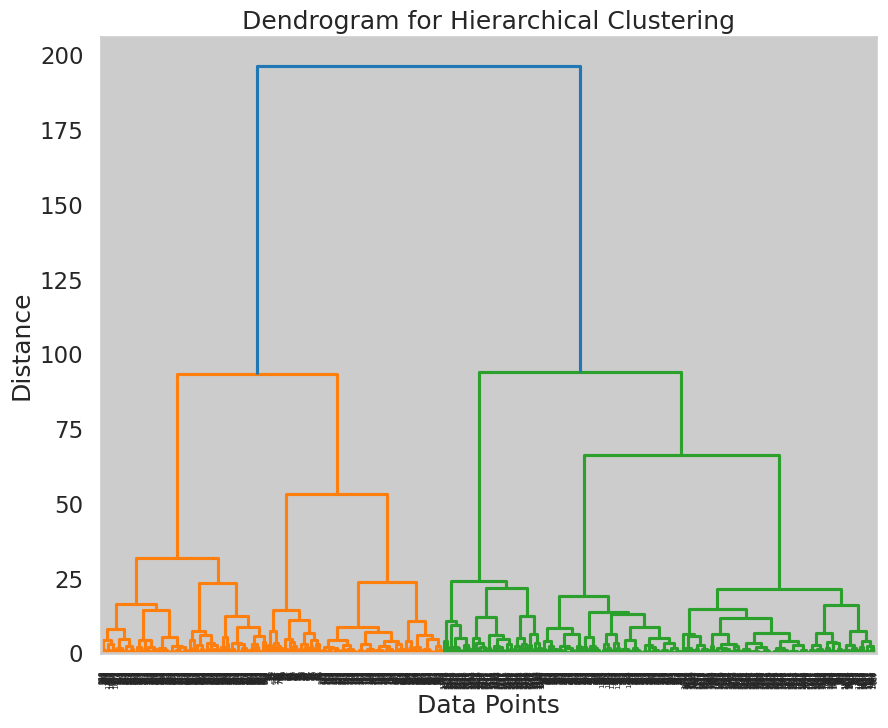

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(Multi_blob_Data, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of complete and affinity of manhattan. Silhouette Score is 0.4723755464253166.


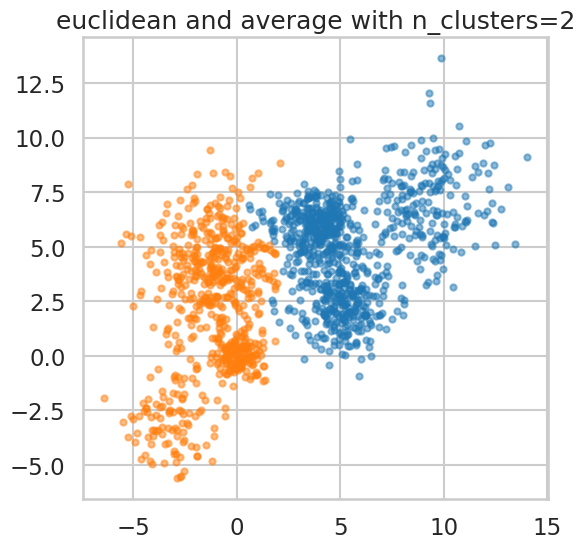

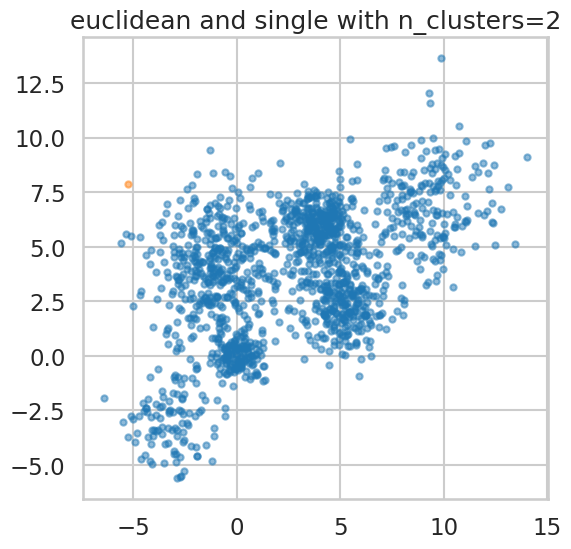

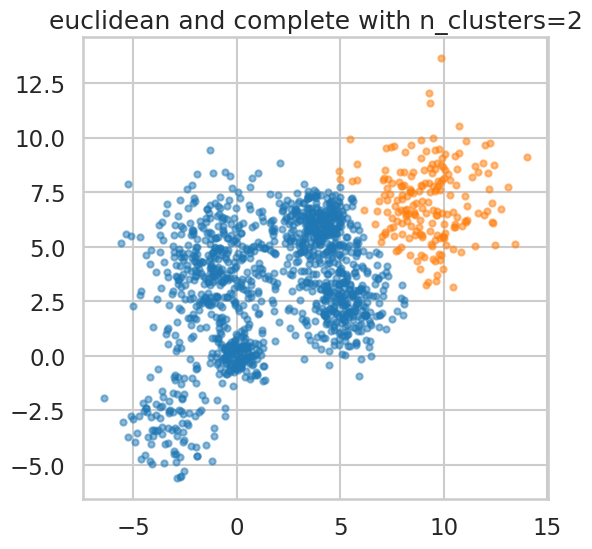

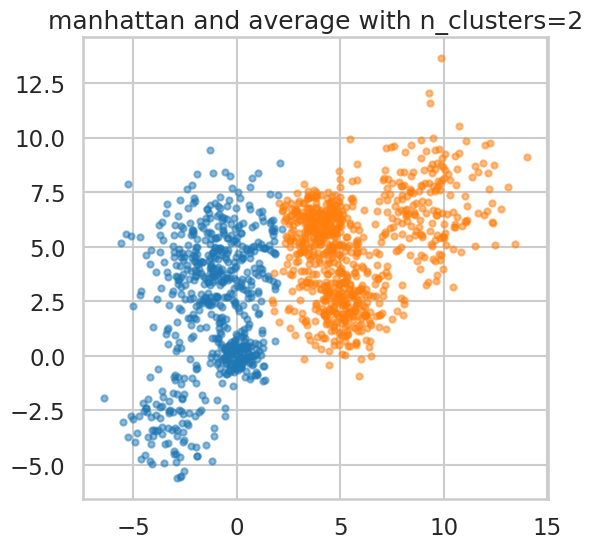

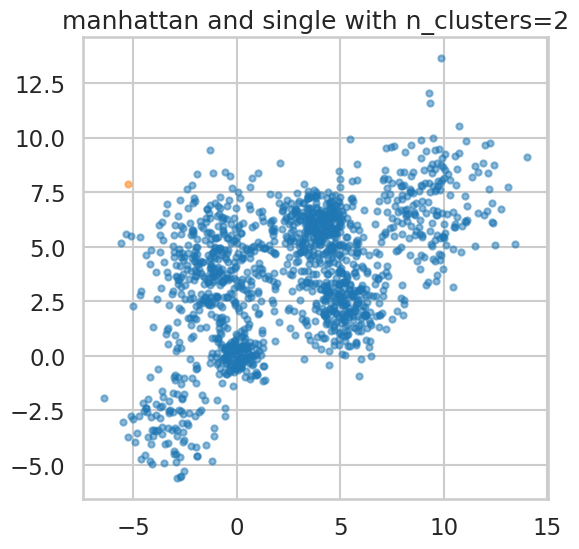

...

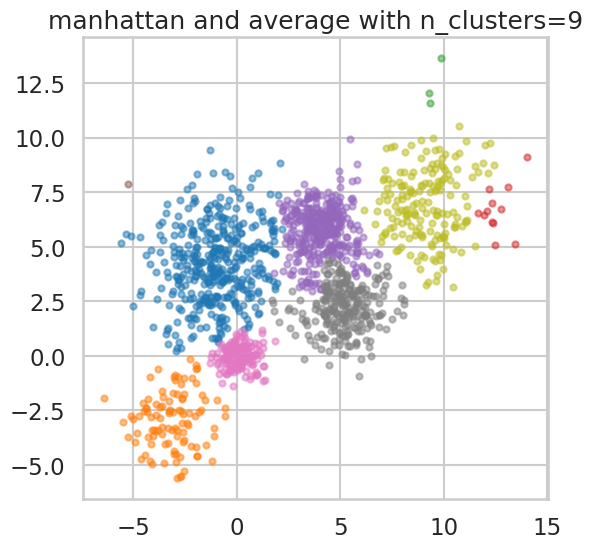

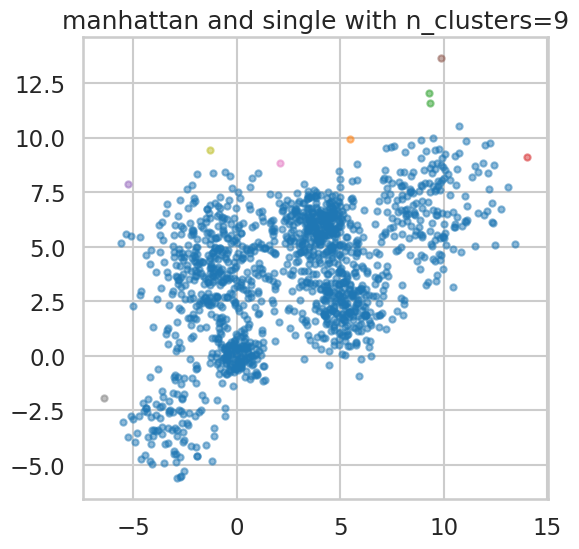

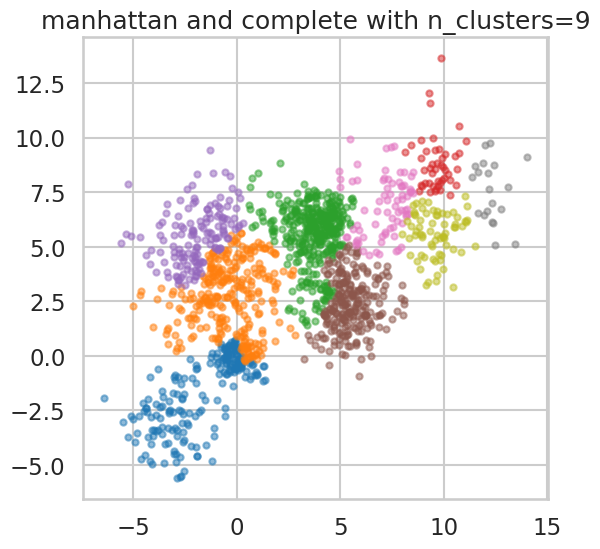

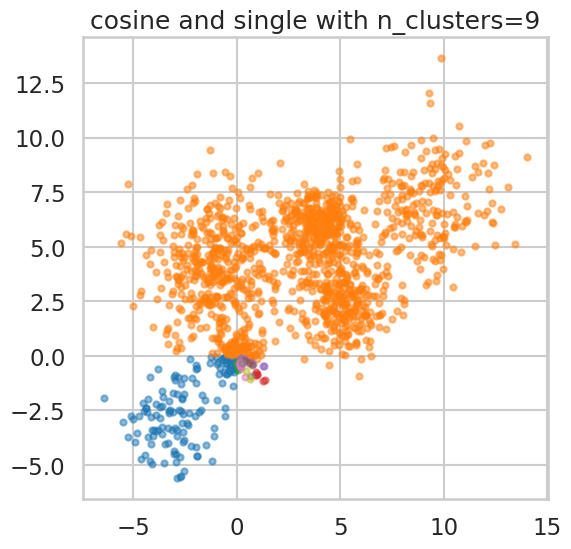

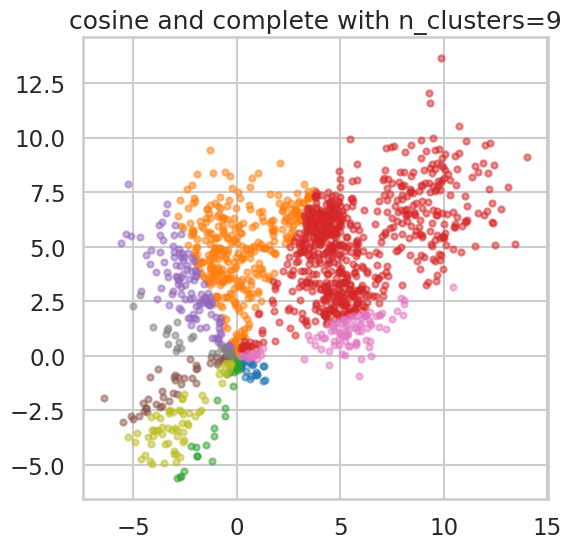

In [ ]:
s = []
linkage_list = ["average", "single", "complete"]
affinity_list = ["euclidean", "manhattan", "cosine"]
n = np.arange(2, 10)
best = -1
best_affinity = ""
best_n = 1
best_linkage = ""

for n_clusters in n:
    for affinity in affinity_list:
        for linkage in linkage_list:
            if (linkage == "average" and affinity == "cosine") :
                continue

            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage)
            model = model.fit(Multi_blob_Data)

            plt.figure(figsize=(6,6))
            plt.title(f"{affinity} and {linkage} with n_clusters={n_clusters}")
            display_aglo_cluster(Multi_blob_Data, model, n_clusters)

            silhouette = silhouette_score(Multi_blob_Data, model.labels_)
            s.append(silhouette)

            if silhouette >= best:
                best_n = n_clusters
                best = silhouette
                best_affinity = affinity
                best_linkage = linkage

print(f"Best agglomerative clustering model for this data is number of clusters= {best_n} "
      f"with linkage of {best_linkage} and affinity of {best_affinity}. "
      f"Silhouette Score is {best}.")

###Comments on Agglomerative clustering:

###1. we will use number of clusters instead of distance threshold which gives the same meaning -> the stopping criteria while grouping

###2. we eleminated linkage == "average" and affinity == "cosine" since they are not compatible


###3. Best agglomerative clustering model for this data is number of clusters= 2 with linkage of complete and affinity of manhattan. Silhouette Score is 0.472 which is less than k-means, this algo fails to cluster the data correctly since the clusters are very close to each other and the distance within the cluster is high (data distorted) so the value will be small

### DBScan
* Use DBScan function to  to cluster the above data.
* In the  DBscan change the following parameters:
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case.
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques.
* Record your observations and comments.

Best DBScan clustering model for this data with epsilon 2.8000000000000003 and min samples 25 has silhouette score 0.4685207355522043 with number of clusters equal to 2


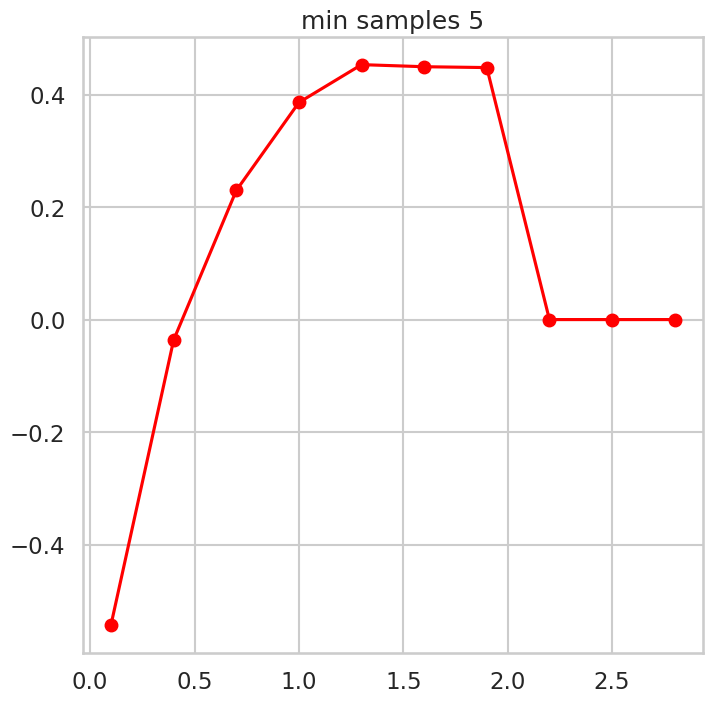

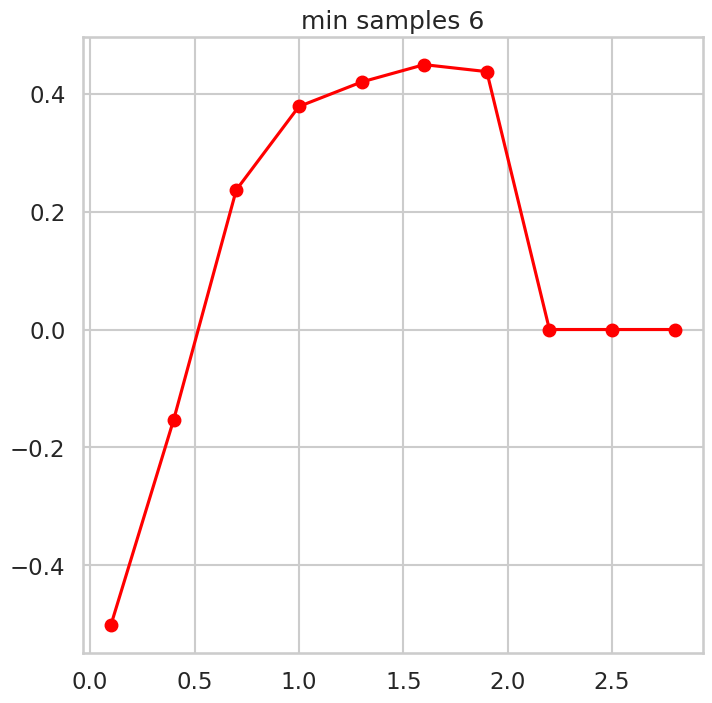

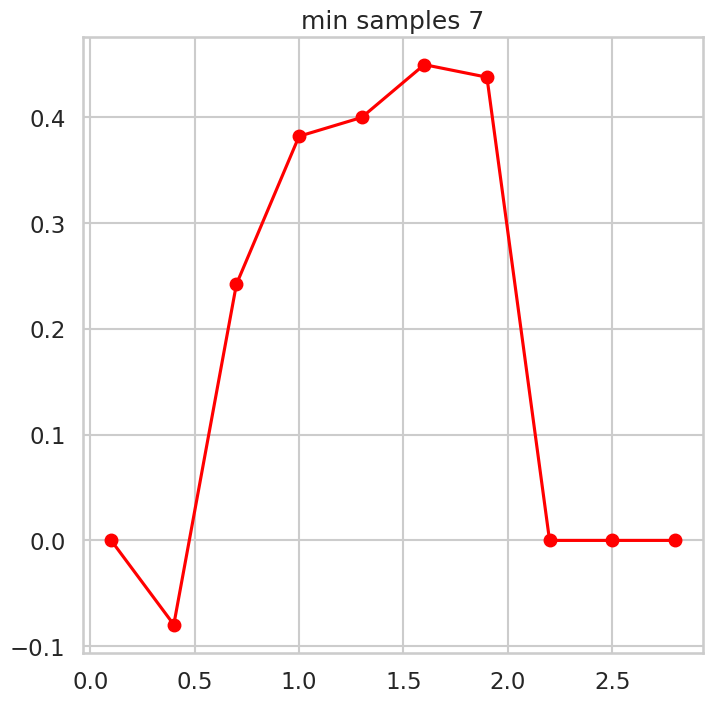

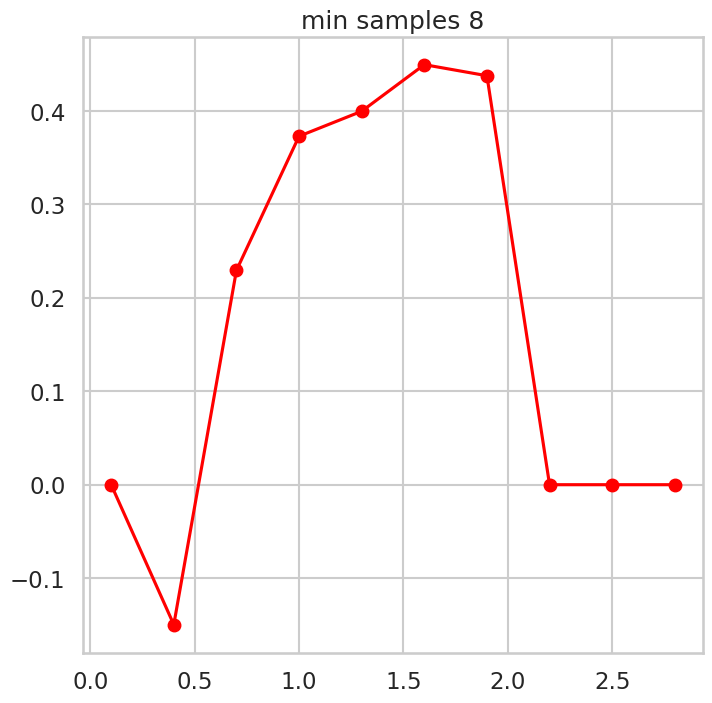

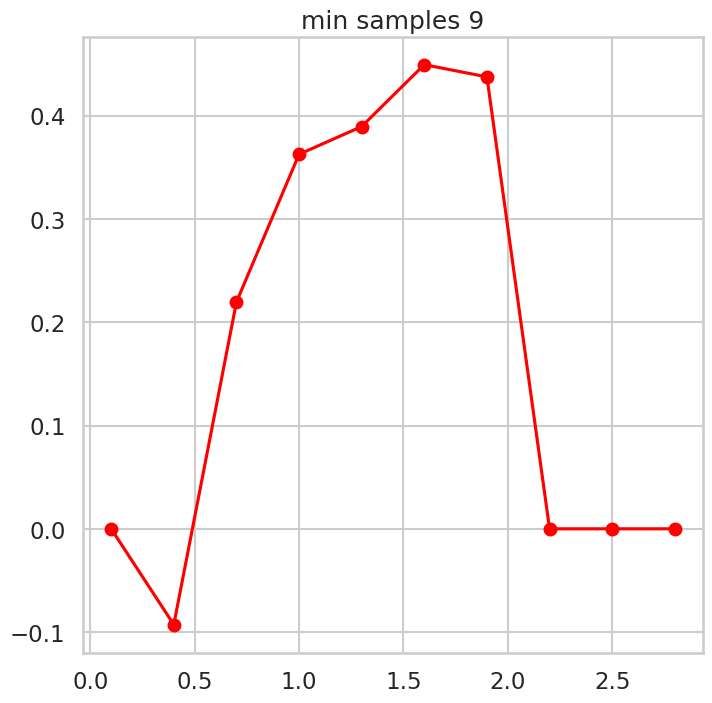

...

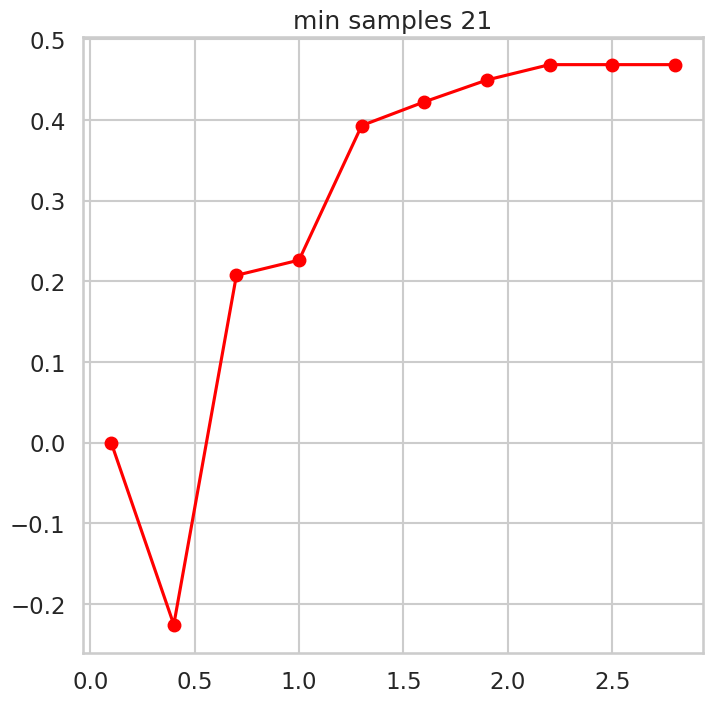

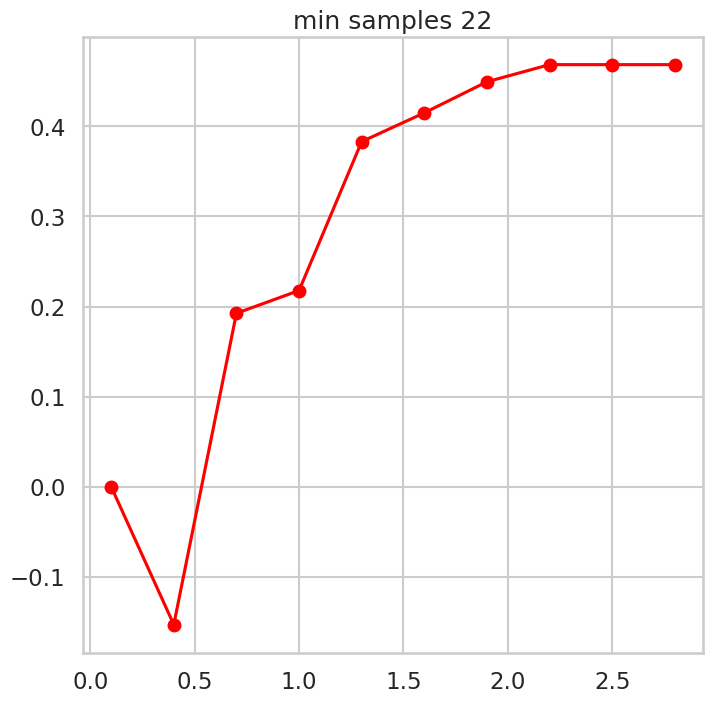

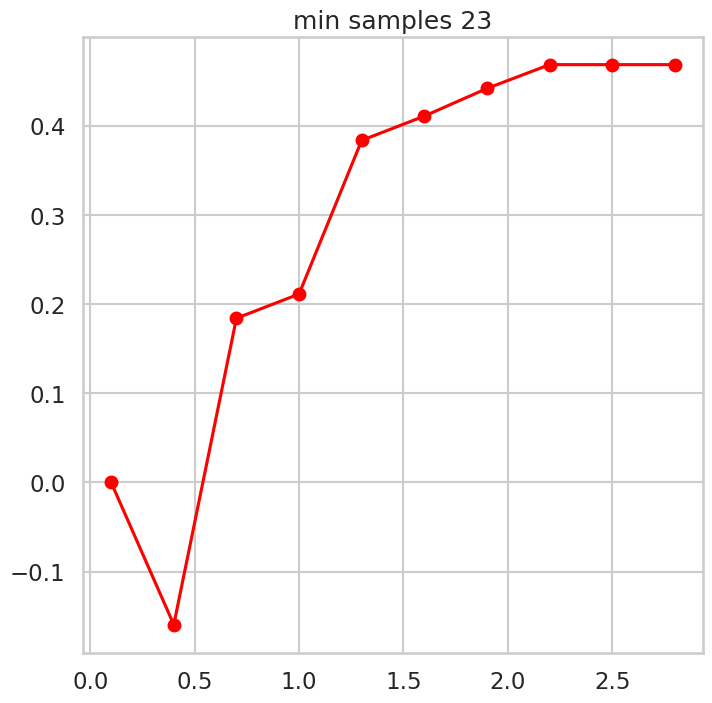

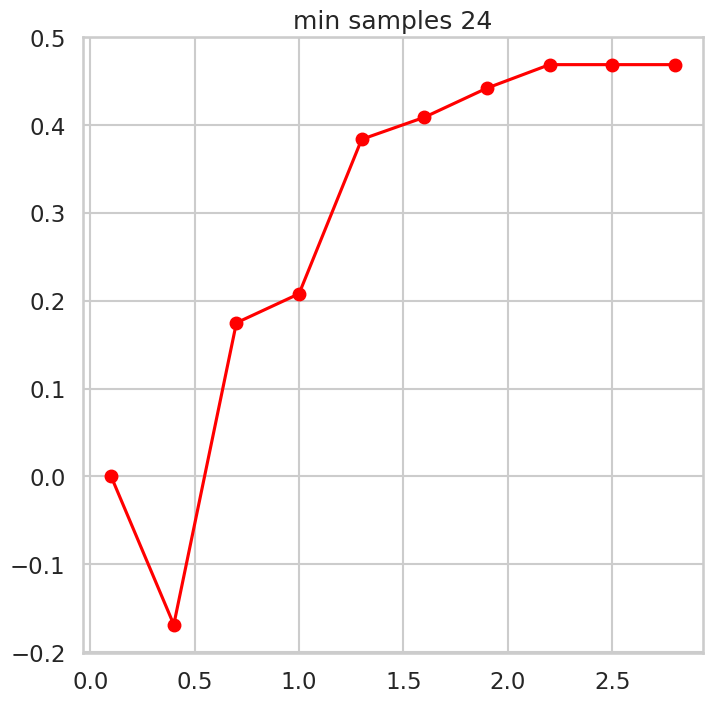

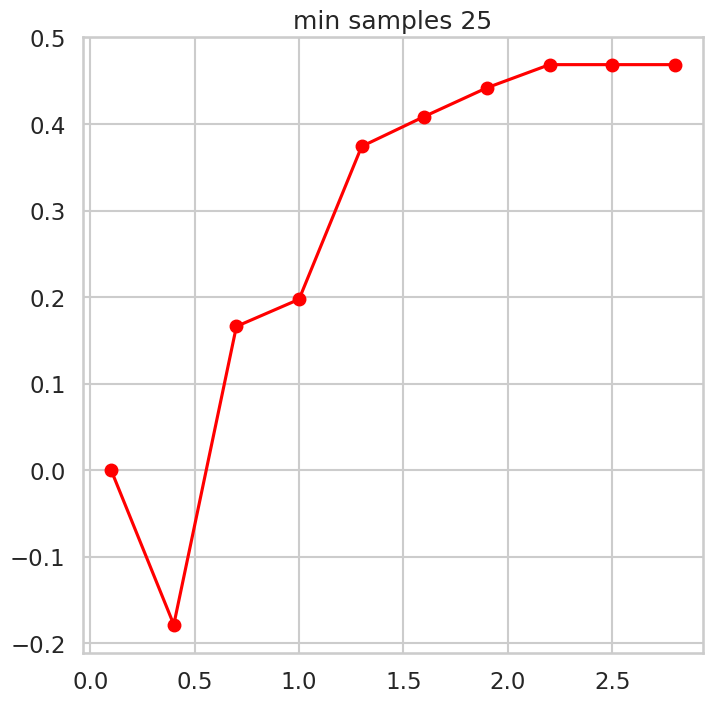

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

best_n_clusters=1
best_eps=0.1
best_min=5
best_s=-1
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.3):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(Multi_blob_Data)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(Multi_blob_Data, cluster_labels)
    s.append(silhouette)
    if silhouette >= best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters=len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.3), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} with number of clusters equal to {best_n_clusters}")


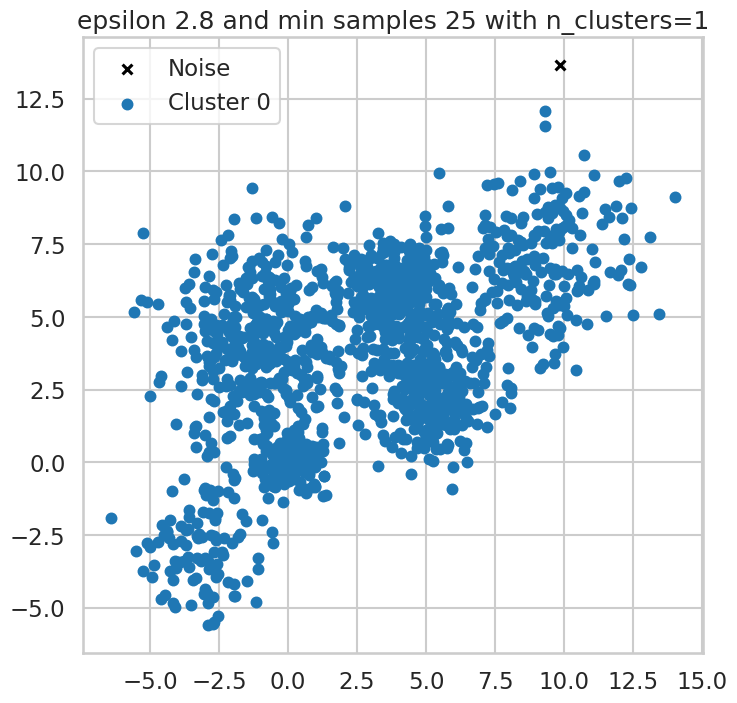

In [ ]:
dbscan = DBSCAN(eps=2.8, min_samples=25)
cluster_labels = dbscan.fit_predict(Multi_blob_Data)
unique_labels = np.unique(cluster_labels)

plt.figure(figsize=(8, 8))
plt.title(f"epsilon {2.8} and min samples {25} with n_clusters={len(unique_labels) - (1 if -1 in unique_labels else 0)}")

for label in unique_labels:
    if label == -1:
        plt.scatter(Multi_blob_Data[cluster_labels == label, 0], Multi_blob_Data[cluster_labels == label, 1],
                    c='black', label='Noise', marker='x', s=50)
    else:
        plt.scatter(Multi_blob_Data[cluster_labels == label, 0], Multi_blob_Data[cluster_labels == label, 1],
                    label=f'Cluster {label}', cmap='plasma', s=50)

plt.legend()
plt.show()


###Comments on DBSCAN clustering:

###Best DBScan clustering model for this data with epsilon 2.8 and min samples 25 has silhouette score 0.467 with number of clusters equal to 2 (1 cluster for data and one for noise)

###This model fails to cluster correctly into 6 clusters since the data points are very close to each other thus they belong to the same cluster and the model can not distinct between clusters

###For the multi blob data, k-means gave the best silhouette score of 0.49 and matchs the 6 clusters of the initialization

# iris data set
The iris data set is test data set that is part of the Sklearn module
which contains 150 records each with 4 features. All the features are represented by real numbers.

The data represents three classes.


* Repeat all the above clustering approaches and steps on the above data.
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches.
* Is your clustering outcome consistent with the labels?

In [178]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
# ['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [179]:
df_iris= pd.DataFrame(iris_data.data, columns=iris_data.feature_names)

In [180]:
df_iris

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [181]:
df_iris.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB


In [182]:
df_iris.corr()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
sepal length (cm),1.000000,-0.117570,0.871754,0.817941
sepal width (cm),-0.117570,1.000000,-0.428440,-0.366126
petal length (cm),0.871754,-0.428440,1.000000,0.962865
petal width (cm),0.817941,-0.366126,0.962865,1.000000


Since there is a high correlation between petal length and petal width so we can use PCA to combine them together into 1 feature to reduce the correlation between features
Now we have reduced the dataset into 3 features

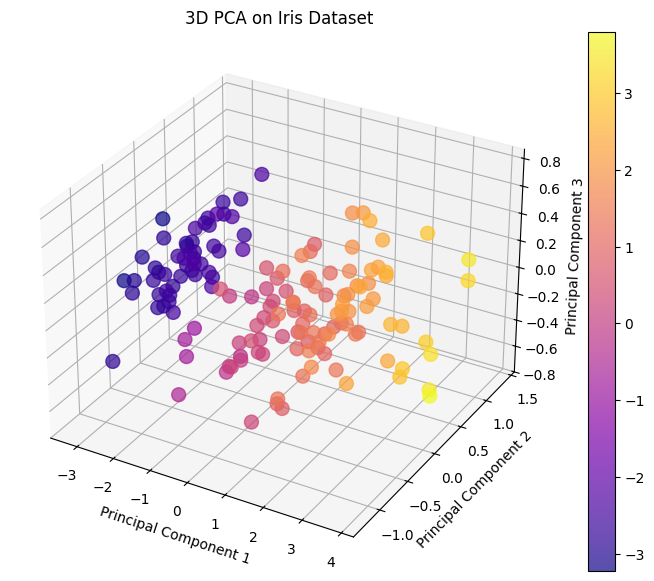

In [183]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

pca = PCA(n_components=3)
iris_pca = pca.fit_transform(df_iris)

df_pca = pd.DataFrame(iris_pca, columns=['PC1', 'PC2','PC3'])

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], c=df_pca['PC1'], cmap='plasma', s=100, alpha=0.7)


ax.set_title('3D PCA on Iris Dataset')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')


plt.colorbar(sc)
plt.show()

we can clearly see that the data has 3 clusters however there is an overlap between 2 of them so this can explain if the algorithm fails to distinguish between them during clustering

In [184]:
df_pca.corr()

,PC1,PC2,PC3
PC1,1.000000e+00,2.108677e-14,9.432910e-16
PC2,2.108677e-14,1.000000e+00,-3.767569e-14
PC3,9.432910e-16,-3.767569e-14,1.000000e+00


In [185]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_iris_scaled = scaler.fit_transform(df_iris)
df_iris_scaled = pd.DataFrame(df_iris_scaled, columns=df_iris.columns)

iris_scaled_pca = pca.fit_transform(df_iris_scaled)

df_scaled_pca = pd.DataFrame(iris_scaled_pca, columns=['PC1', 'PC2','PC3'])

## K-means

### K-means without data scaling

In [186]:
ssd = []
ssd1 = []

for k in range(2,15):

    model = KMeans(n_clusters=k)


    model.fit(df_pca)

    ssd.append(model.inertia_)
    labels= model.fit_predict(df_pca)

    silhouette=silhouette_score(df_pca,labels)
    ssd1.append(silhouette)

Text(0, 0.5, ' Sum of Squared Distances')

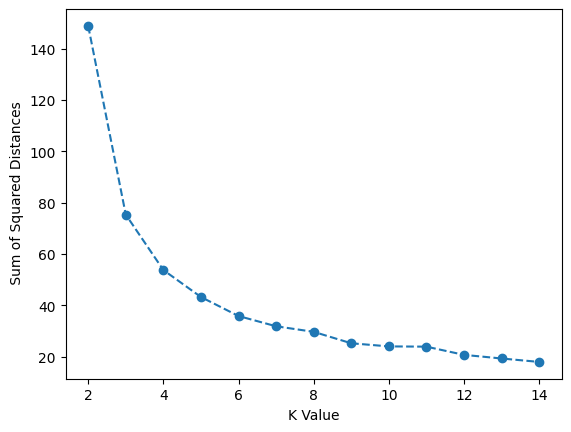

In [187]:
plt.plot(range(2,15),ssd,'o--')
plt.xlabel("K Value")
plt.ylabel(" Sum of Squared Distances")

0.6869258005156986


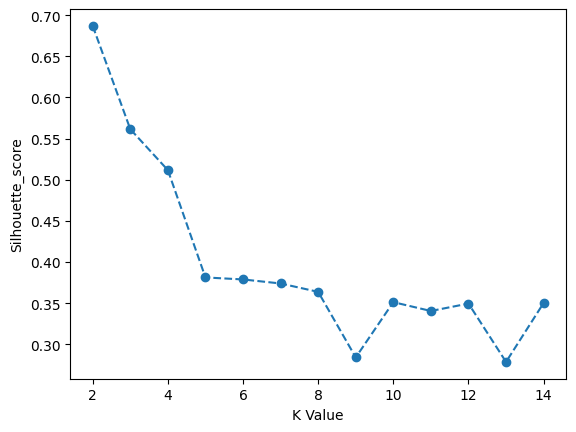

In [188]:
plt.plot(range(2,15),ssd1,'o--')
plt.xlabel("K Value")
plt.ylabel("Silhouette_score")
print( max(ssd1))

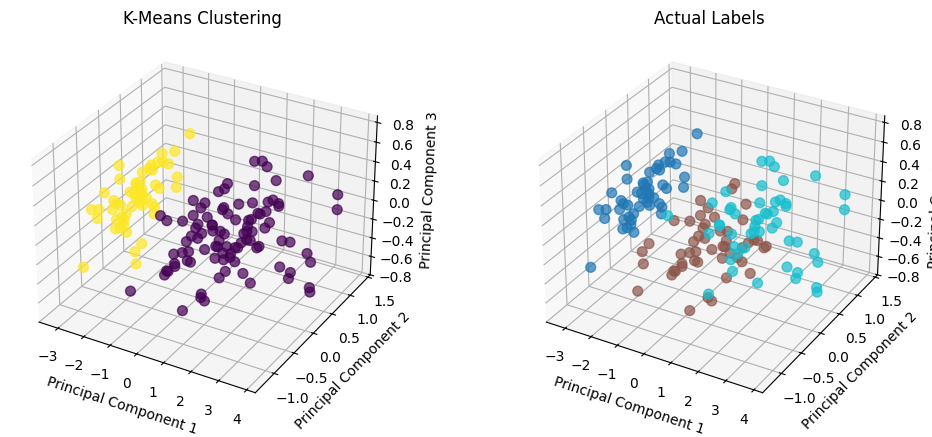

In [189]:
model = KMeans(n_clusters=2)
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("K-Means Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

### K-means with data scaling

In [190]:
ssd = []
ssd1 = []

for k in range(2,15):

    model = KMeans(n_clusters=k)


    model.fit(df_scaled_pca)

    ssd.append(model.inertia_)
    labels= model.fit_predict(df_scaled_pca)

    silhouette=silhouette_score(df_scaled_pca,labels)
    ssd1.append(silhouette)

Text(0, 0.5, ' Sum of Squared Distances')

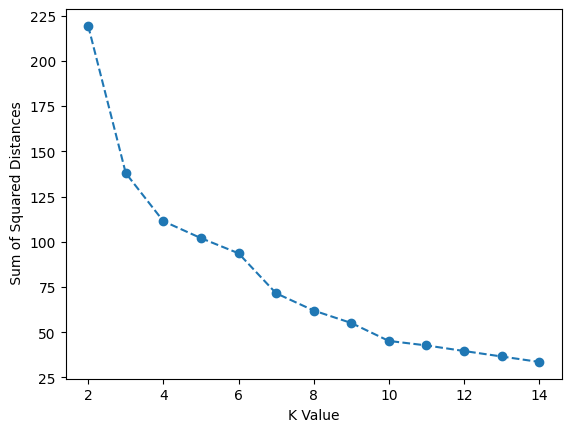

In [191]:
plt.plot(range(2,15),ssd,'o--')
plt.xlabel("K Value")
plt.ylabel(" Sum of Squared Distances")

0.5859517912768418


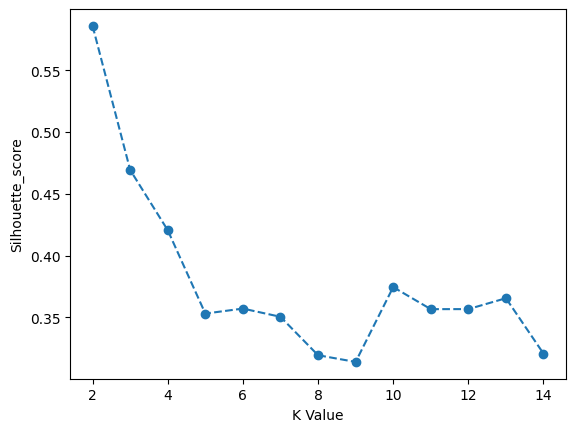

In [192]:
plt.plot(range(2,15),ssd1,'o--')
plt.xlabel("K Value")
plt.ylabel("Silhouette_score")
print( max(ssd1))

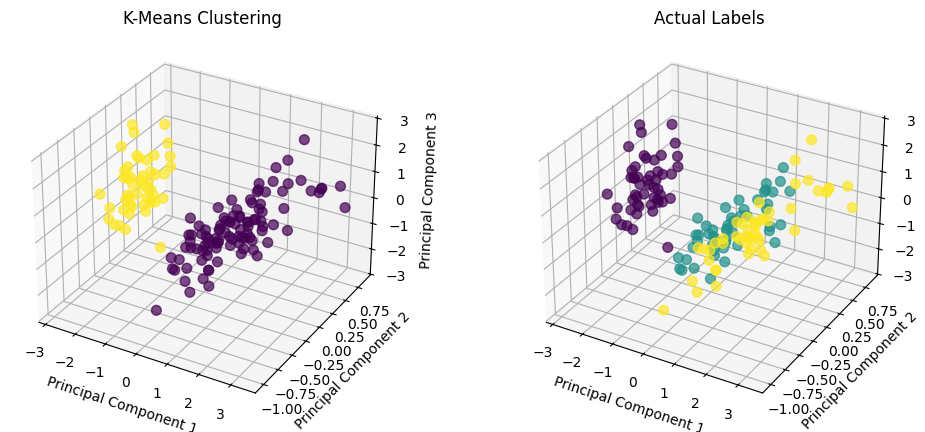

In [193]:
model = KMeans(n_clusters=2)
iris_clusters = model.fit_predict(df_scaled_pca)
df_scaled_pca["Cluster"] = iris_clusters
df_scaled_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_scaled_pca["PC1"], df_scaled_pca["PC3"],df_scaled_pca["PC2"], c=df_scaled_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("K-Means Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_scaled_pca["PC1"], df_scaled_pca["PC3"],df_scaled_pca["PC2"], c=df_scaled_pca["Actual"], cmap="viridis", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

1.   There is no clear elbow in the 1st graph that illustrates the sum of squared distance Vs number of clusters for the scaled and the non scaled data
2.   Silhouette score did not improved after scaling the data and the best value achieved at k=2 is equal to 0.68
3. Above graph shows the difference between k-means clustering and the actual labels

## Agglomerative

### Agglomerative without data scaling

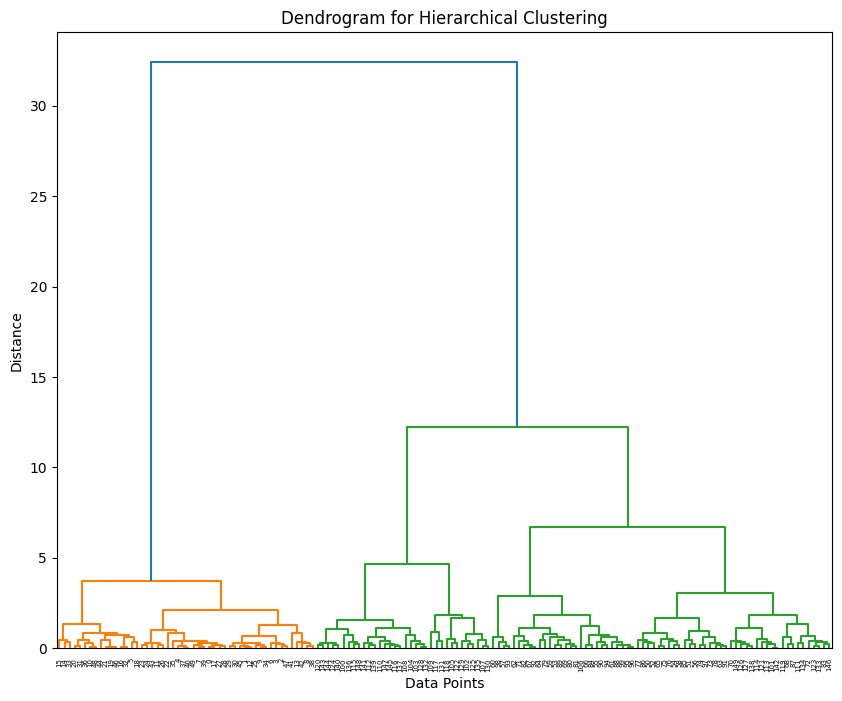

In [48]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(df_pca, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

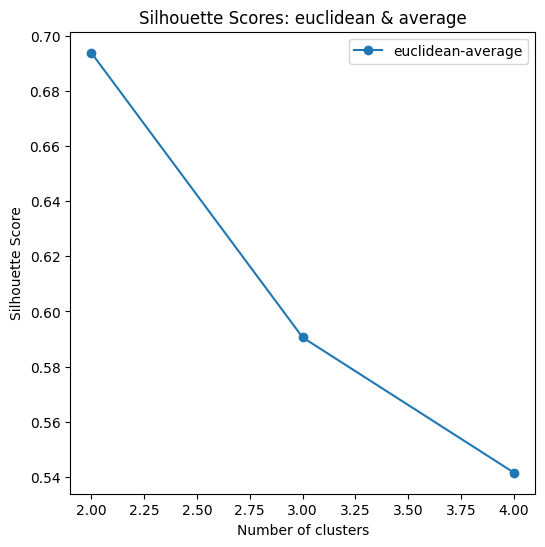

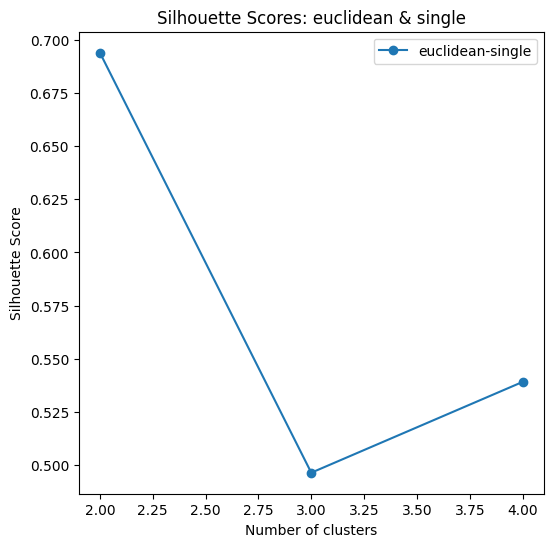

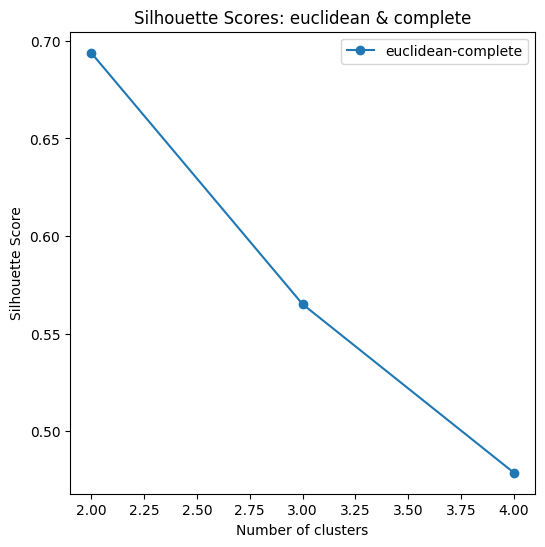

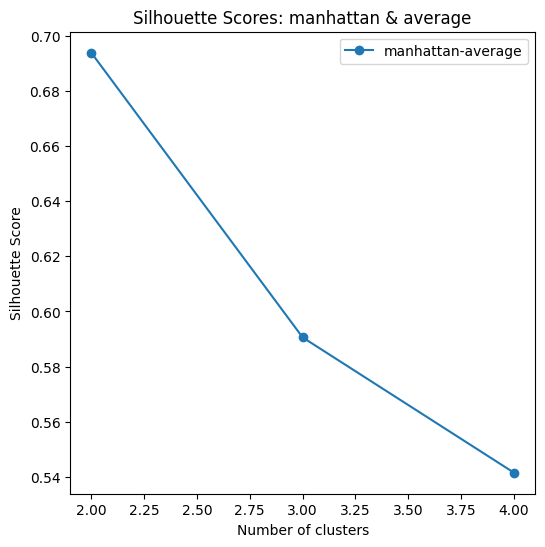

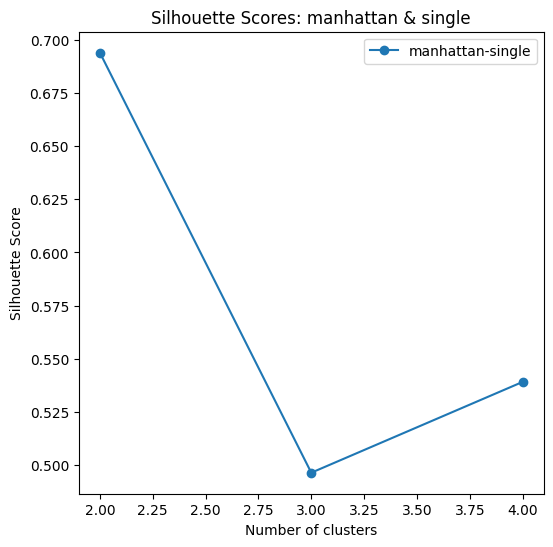

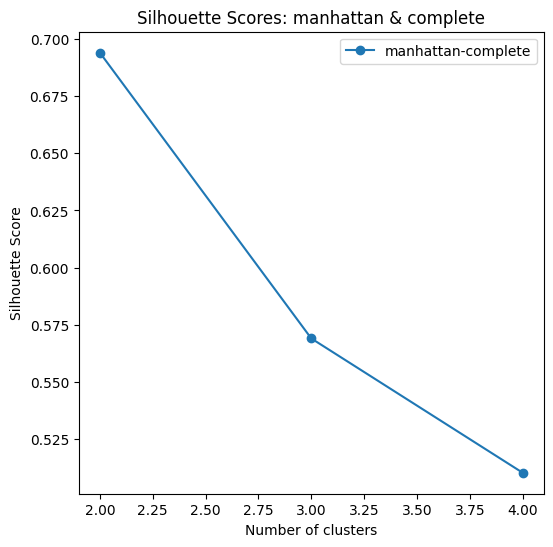

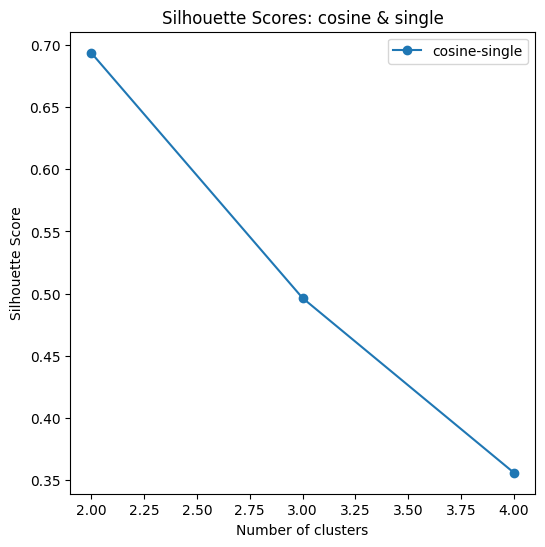

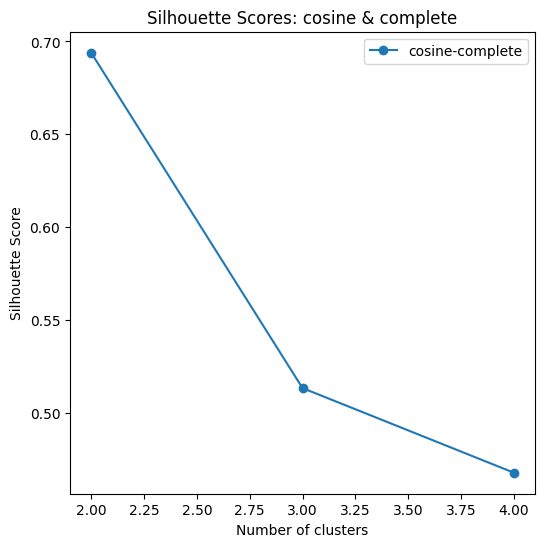

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of complete and affinity of cosine. Silhouette Score is 0.6939163645751162.


In [78]:
linkage_list = ["average", "single", "complete"]
affinity_list = ["euclidean", "manhattan", "cosine"]
n = np.arange(2, 5)

best = -1
best_affinity = ""
best_n = 1
best_linkage = ""

for affinity in affinity_list:
    for linkage in linkage_list:
        s = []
        for n_clusters in n:
            if (linkage == "average" and affinity == "cosine"):
                continue

            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage)
            model = model.fit(df_pca)

            silhouette = silhouette_score(df_pca, model.labels_)
            s.append(silhouette)

            if silhouette >= best:
                best_n = n_clusters
                best = silhouette
                best_affinity = affinity
                best_linkage = linkage

        if s:
            plt.figure(figsize=(6,6))
            plt.plot(n, s, marker='o', linestyle='-', label=f"{affinity}-{linkage}")
            plt.xlabel("Number of clusters")
            plt.ylabel("Silhouette Score")
            plt.title(f"Silhouette Scores: {affinity} & {linkage}")
            plt.legend()
            plt.show()

print(f"Best agglomerative clustering model for this data is number of clusters= {best_n} "
      f"with linkage of {best_linkage} and affinity of {best_affinity}. "
      f"Silhouette Score is {best}.")

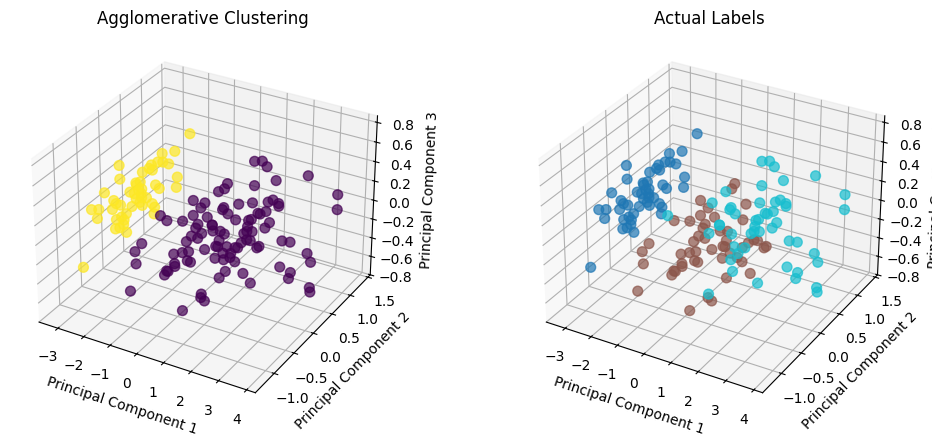

In [85]:
model = AgglomerativeClustering(n_clusters=2, metric="cosine", linkage="complete" )
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("Agglomerative Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

### Agglomerative with data scaling

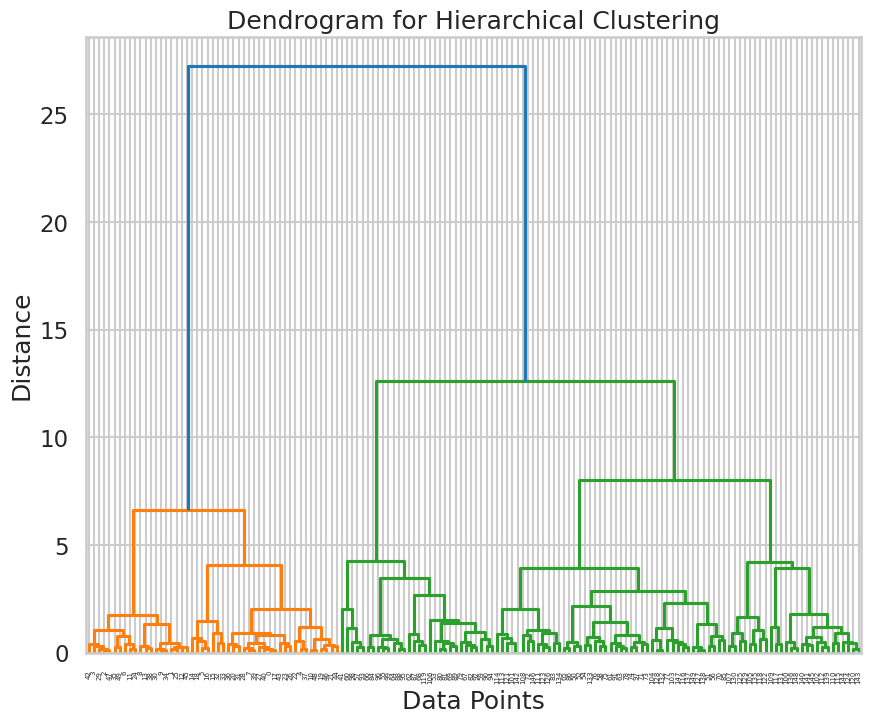

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(df_iris_scaled, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

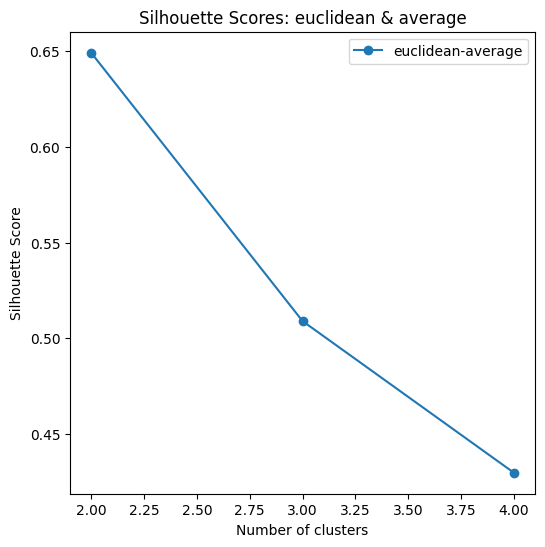

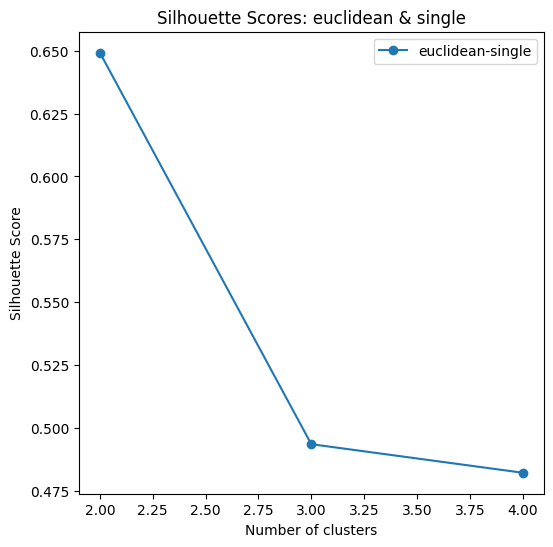

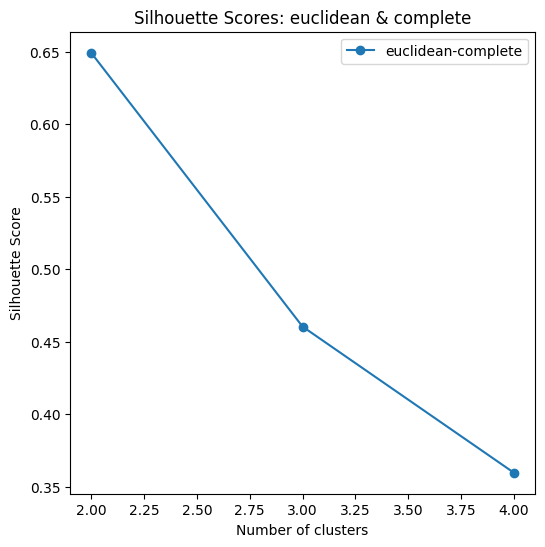

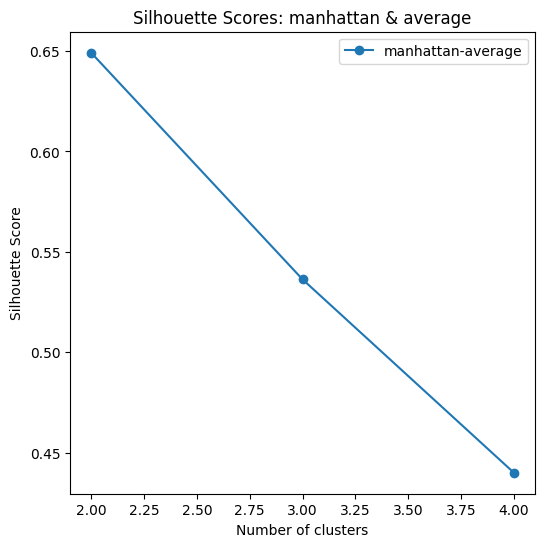

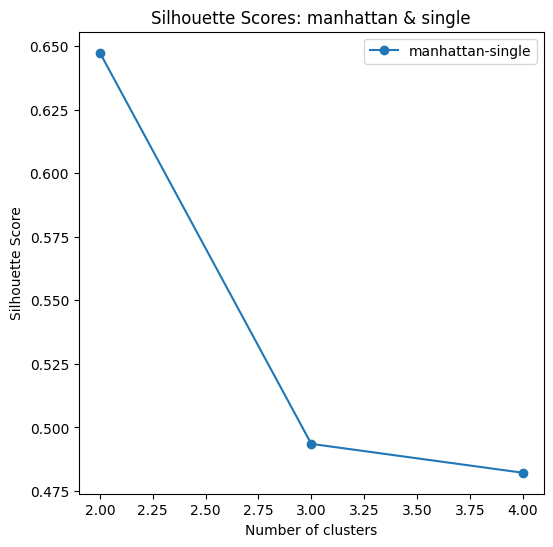

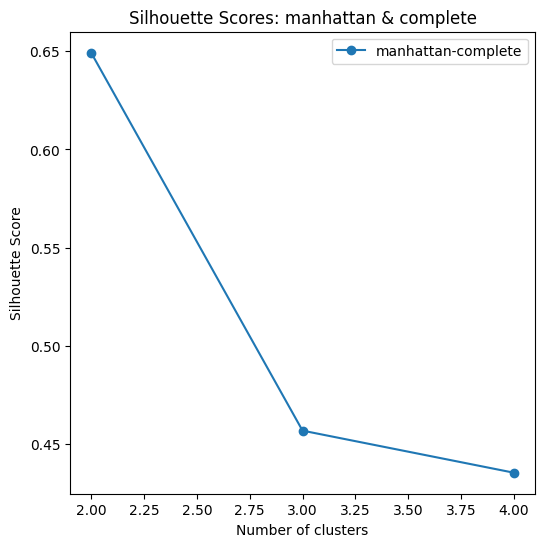

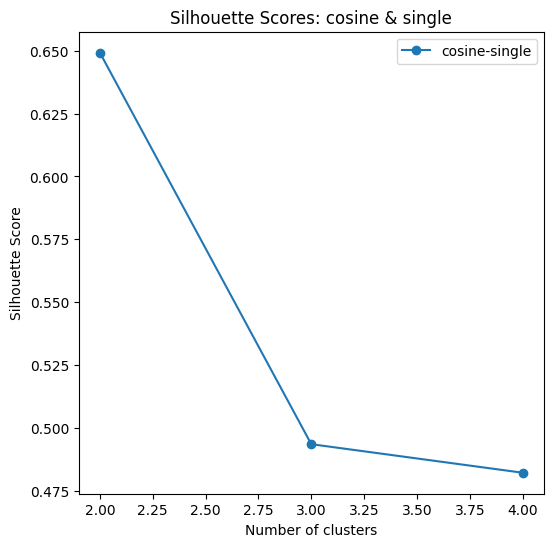

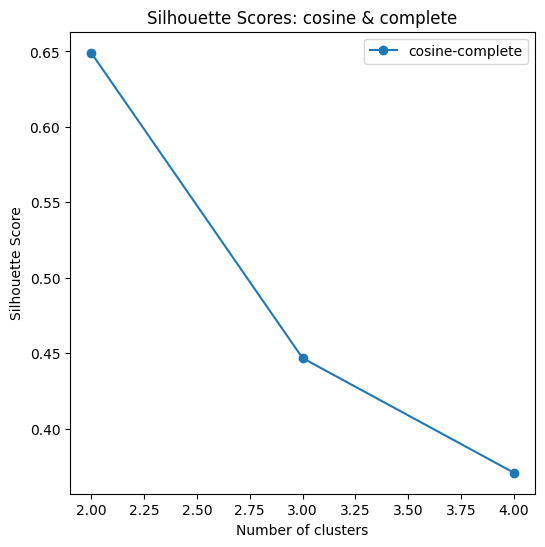

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of complete and affinity of cosine. Silhouette Score is 0.6491876818043931.


In [92]:
linkage_list = ["average", "single", "complete"]
affinity_list = ["euclidean", "manhattan", "cosine"]
n = np.arange(2, 5)

best = -1
best_affinity = ""
best_n = 1
best_linkage = ""

for affinity in affinity_list:
    for linkage in linkage_list:
        s = []
        for n_clusters in n:
            if (linkage == "average" and affinity == "cosine"):
                continue

            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage)
            model = model.fit(df_scaled_pca)

            silhouette = silhouette_score(df_scaled_pca, model.labels_)
            s.append(silhouette)

            if silhouette >= best:
                best_n = n_clusters
                best = silhouette
                best_affinity = affinity
                best_linkage = linkage

        if s:
            plt.figure(figsize=(6,6))
            plt.plot(n, s, marker='o', linestyle='-', label=f"{affinity}-{linkage}")
            plt.xlabel("Number of clusters")
            plt.ylabel("Silhouette Score")
            plt.title(f"Silhouette Scores: {affinity} & {linkage}")
            plt.legend()
            plt.show()

print(f"Best agglomerative clustering model for this data is number of clusters= {best_n} "
      f"with linkage of {best_linkage} and affinity of {best_affinity}. "
      f"Silhouette Score is {best}.")

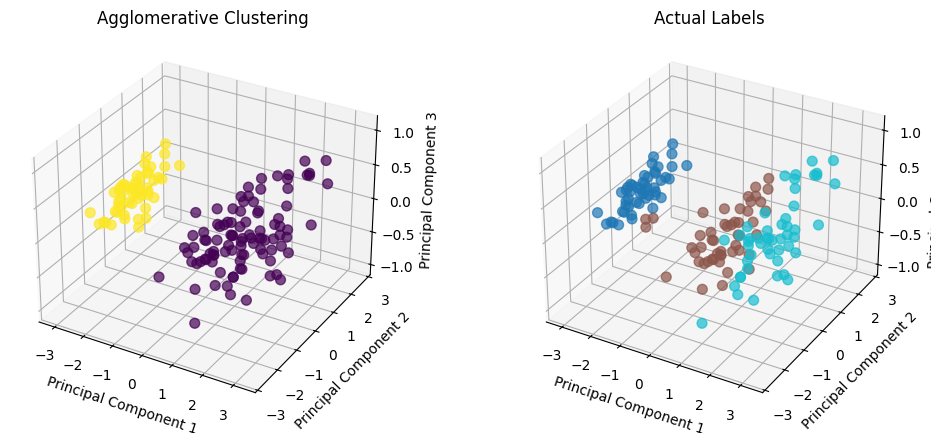

In [91]:
model = AgglomerativeClustering(n_clusters=2, metric="cosine", linkage="complete" )
iris_clusters = model.fit_predict(df_scaled_pca)
df_scaled_pca["Cluster"] = iris_clusters
df_scaled_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_scaled_pca["PC1"], df_scaled_pca["PC2"], df_scaled_pca["PC3"], c=df_scaled_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("Agglomerative Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_scaled_pca["PC1"], df_scaled_pca["PC2"], df_scaled_pca["PC3"], c=df_scaled_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

1. Best agglomerative clustering model without clustering is number of clusters= 2 with linkage of complete and affinity of cosine. Silhouette Score is 0.69
2. Best agglomerative clustering model with clustering is number of clusters= 2 with linkage of single and affinity of manhattan. Silhouette Score is 0.64
3. Silhouette Score did not improve even after scaling
4. Graph above illustrates the difference between the actual original labels and the clustering done by agglomerative clustering

## DBCAN

### DBSCAN without data scaling

Best DBScan clustering model for this data with epsilon 1.1 and min samples 5 has silhouette score 0.6982676464229055 with number of clusters equal to 2


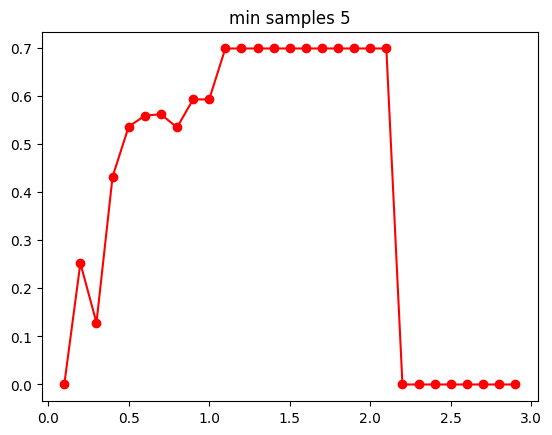

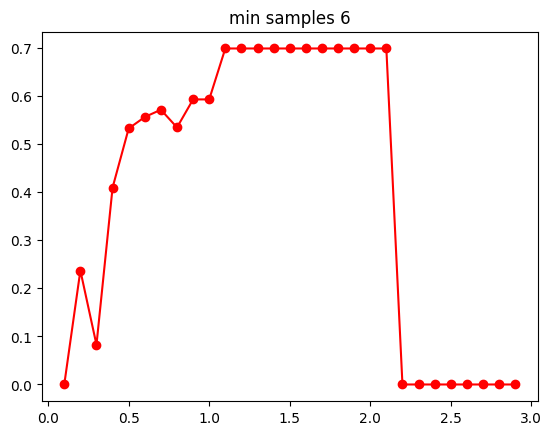

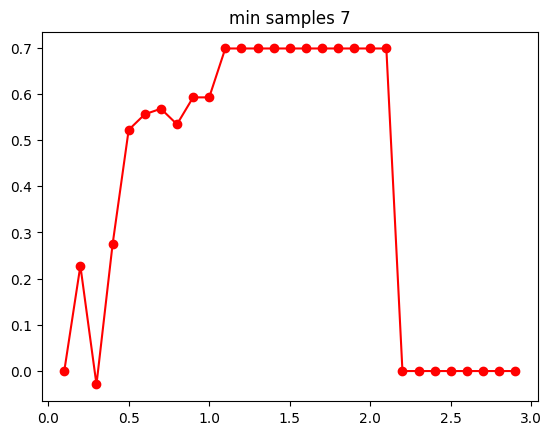

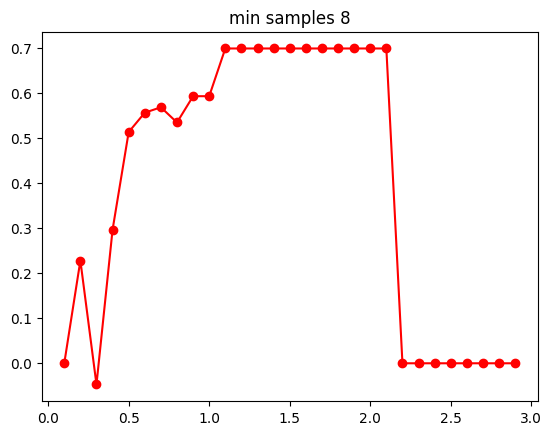

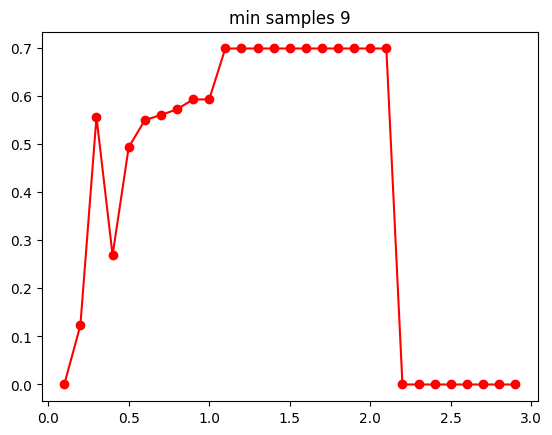

...

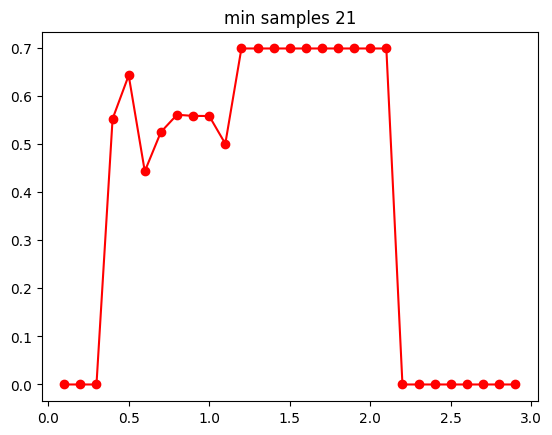

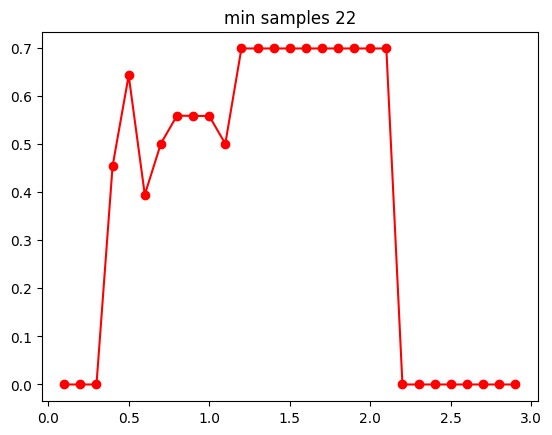

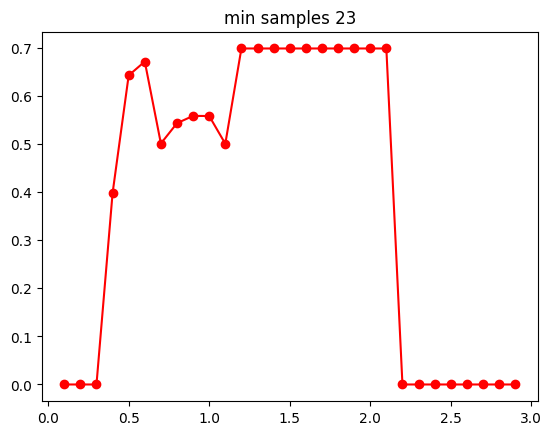

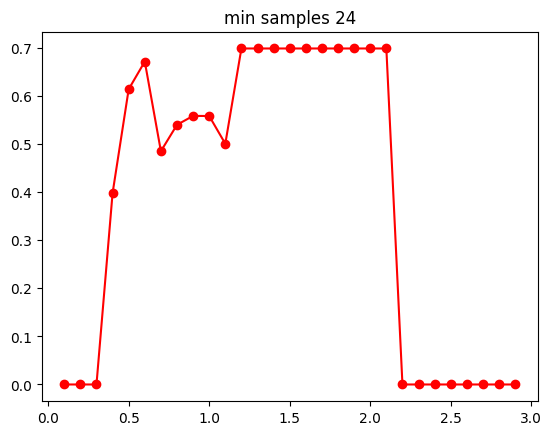

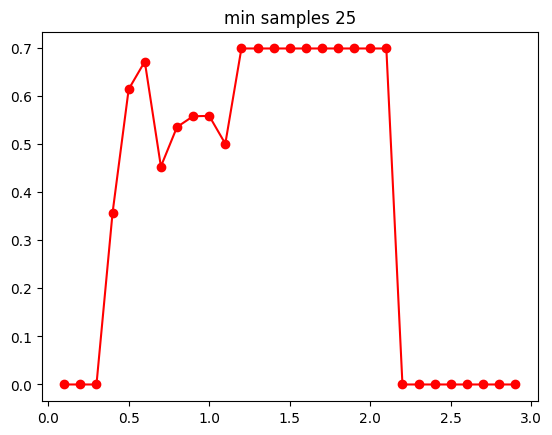

In [106]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

best_n_clusters=1
best_eps=0.1
best_min=5
best_s=-1
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters=len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.1), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} with number of clusters equal to {best_n_clusters}")


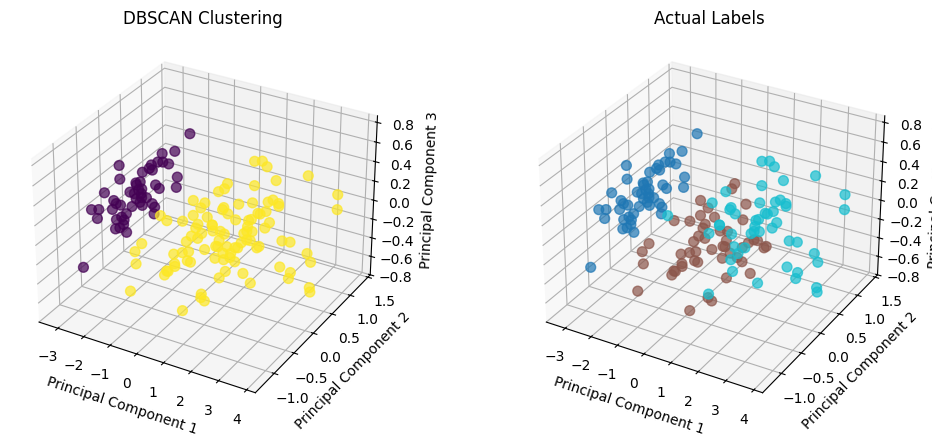

In [107]:
model = DBSCAN(eps=1.1, min_samples=5)
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("DBSCAN Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

### DBSCAN with data scaling

Best DBScan clustering model for this data with epsilon 1.9000000000000001 and min samples 11 has silhouette score 0.6491876818043931 with number of clusters equal to 2


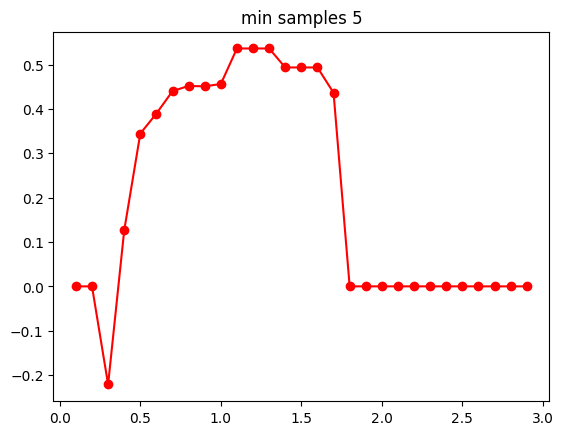

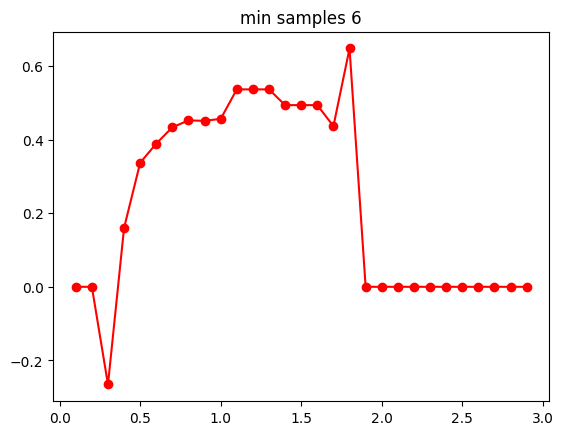

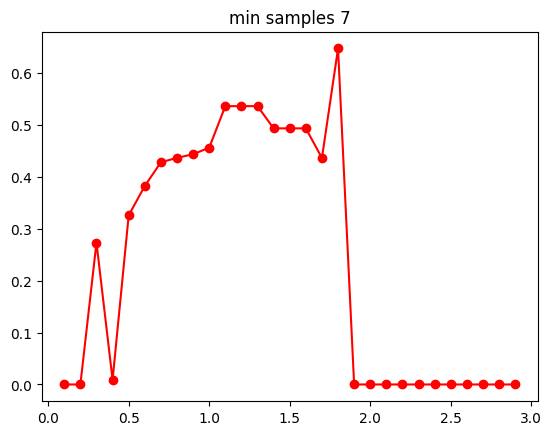

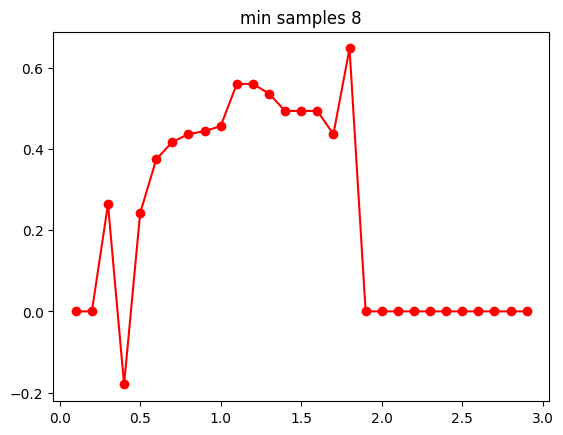

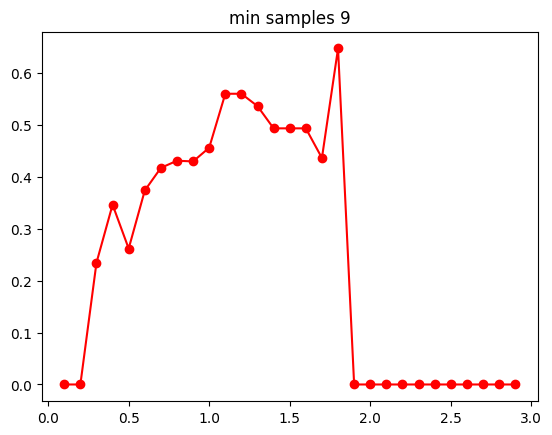

...

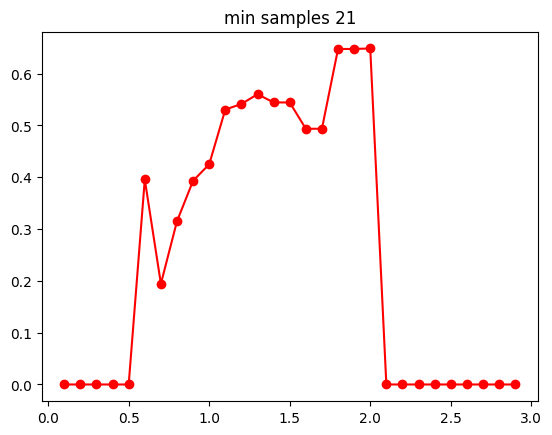

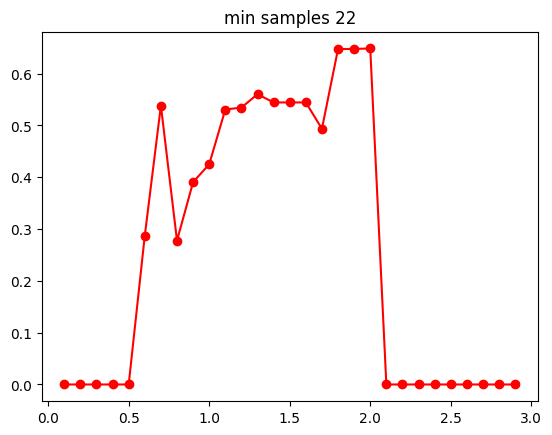

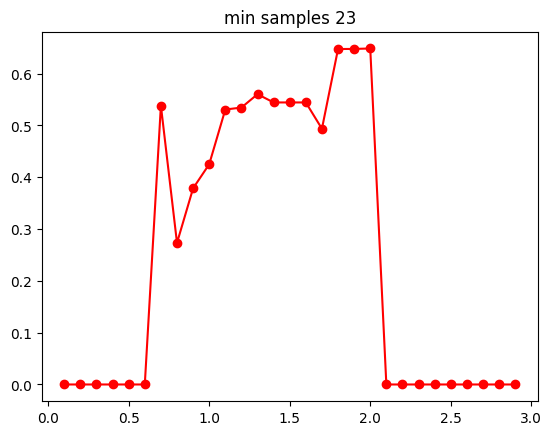

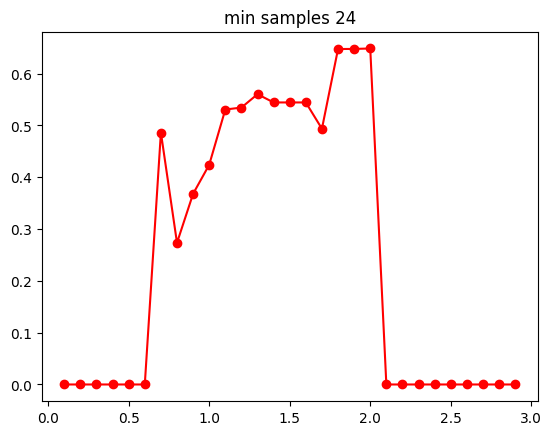

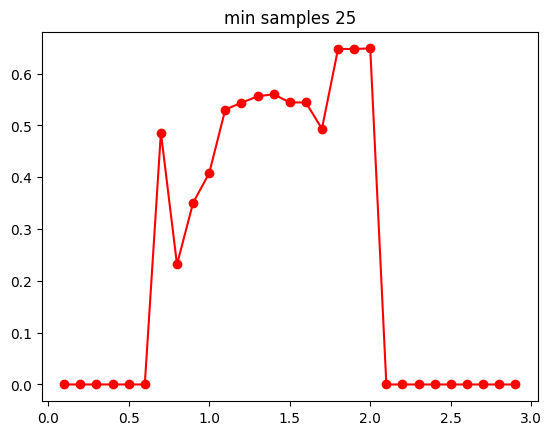

In [108]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

best_n_clusters=1
best_eps=0.1
best_min=5
best_s=-1
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.1):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_scaled_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_scaled_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters=len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.1), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} with number of clusters equal to {best_n_clusters}")


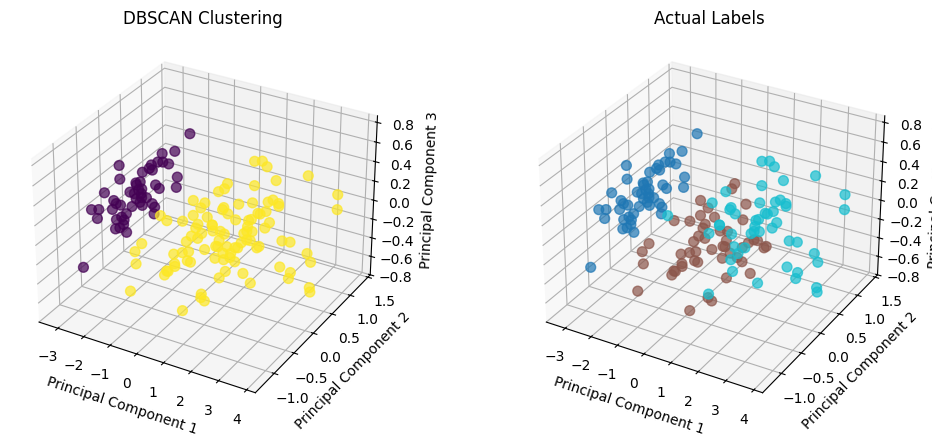

In [110]:
model = DBSCAN(eps=1.9, min_samples=11)
iris_clusters = model.fit_predict(df_pca)
df_pca["Cluster"] = iris_clusters
df_pca["Actual"] = iris_data.target

fig = plt.figure(figsize=(12, 5))


ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Cluster"], cmap="viridis", s=50, alpha=0.7)
ax1.set_title("DBSCAN Clustering")
ax1.set_xlabel("Principal Component 1")
ax1.set_ylabel("Principal Component 2")
ax1.set_zlabel("Principal Component 3")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca["PC1"], df_pca["PC2"], df_pca["PC3"], c=df_pca["Actual"], cmap="tab10", s=50, alpha=0.7)
ax2.set_title("Actual Labels")
ax2.set_xlabel("Principal Component 1")
ax2.set_ylabel("Principal Component 2")
ax2.set_zlabel("Principal Component 3")

plt.show()

1. Best DBScan clustering model for this data with epsilon 1.1 and min samples 25 has silhouette score 0.7 with number of clusters equal to 2

2. Best DBScan clustering model for this data with epsilon 1.9 and min samples 11 has silhouette score 0.65 with number of clusters equal to 2

3. Above graph shows the difference between DBSCAN clustering and the actual labels


All clustering algos failed to cluster the data into 3 clusters and gave almost the same silhouette score =0.68. Since there is an overlap between groups in the original labels so these techniques are not convinient to cluster this dataset

# Customer dataset
Repeat all the above on the customer data set

In [202]:
df_cust= pd.read_csv('/content/Customer data.csv')

In [203]:
df_cust

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


In [204]:
df_cust.set_index('ID',inplace=True)

In [205]:
df_cust.corr()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
Sex,1.000000,0.566511,-0.182885,0.244838,-0.195146,-0.202491,-0.300803
Marital status,0.566511,1.000000,-0.213178,0.374017,-0.073528,-0.029490,-0.097041
Age,-0.182885,-0.213178,1.000000,0.654605,0.340610,0.108388,0.119751
Education,0.244838,0.374017,0.654605,1.000000,0.233459,0.064524,0.034732
Income,-0.195146,-0.073528,0.340610,0.233459,1.000000,0.680357,0.490881
Occupation,-0.202491,-0.029490,0.108388,0.064524,0.680357,1.000000,0.571795
Settlement size,-0.300803,-0.097041,0.119751,0.034732,0.490881,0.571795,1.000000


In [206]:
df_cust.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2000 entries, 100000001 to 100002000
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Sex              2000 non-null   int64
 1   Marital status   2000 non-null   int64
 2   Age              2000 non-null   int64
 3   Education        2000 non-null   int64
 4   Income           2000 non-null   int64
 5   Occupation       2000 non-null   int64
 6   Settlement size  2000 non-null   int64
dtypes: int64(7)
memory usage: 125.0 KB


Since there is a high correlation between occupation & income and age & education so we can combine tem into one feature each one of them to reduce the correlation between features from 7 features to 5 features

In [161]:
pca = PCA(n_components=5)
cust_pca = pca.fit_transform(df_cust)

df_cust_pca = pd.DataFrame(cust_pca, columns=['PC1', 'PC2','PC3','PC4','PC5'])


In [162]:
df_cust_pca.corr()

,PC1,PC2,PC3,PC4,PC5
PC1,1.000000e+00,-5.185784e-15,2.659825e-12,-5.204678e-13,-9.431122e-14
PC2,-5.185784e-15,1.000000e+00,-7.331516e-11,1.055371e-10,-6.215653e-12
PC3,2.659825e-12,-7.331516e-11,1.000000e+00,7.889035e-08,-6.958561e-09
PC4,-5.204678e-13,1.055371e-10,7.889035e-08,1.000000e+00,7.115449e-09
PC5,-9.431122e-14,-6.215653e-12,-6.958561e-09,7.115449e-09,1.000000e+00


In [163]:
from sklearn.preprocessing import MinMaxScaler

scaler1 = MinMaxScaler()
df_cust_scaled = scaler1.fit_transform(df_cust)
df_cust_scaled = pd.DataFrame(df_cust_scaled)
cust_scaled_pca = pca.fit_transform(df_cust_scaled)

df_cust_scaled_pca = pd.DataFrame(cust_scaled_pca, columns=['PC1', 'PC2','PC3','PC4','PC5'])

## K-means

### K-means without data scaling

In [164]:
ssd = []
ssd1 = []

for k in range(2,15):

    model = KMeans(n_clusters=k)


    model.fit(df_cust_pca)

    ssd.append(model.inertia_)
    labels= model.fit_predict(df_cust_pca)

    silhouette=silhouette_score(df_cust_pca,labels)
    ssd1.append(silhouette)

Text(0, 0.5, ' Sum of Squared Distances')

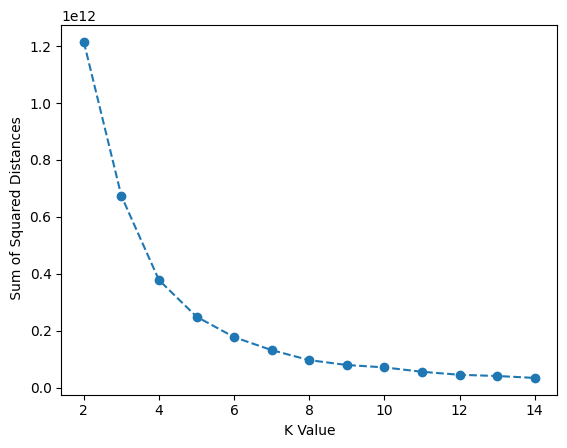

In [165]:
plt.plot(range(2,15),ssd,'o--')
plt.xlabel("K Value")
plt.ylabel(" Sum of Squared Distances")

Text(0, 0.5, 'Silhouette_score')

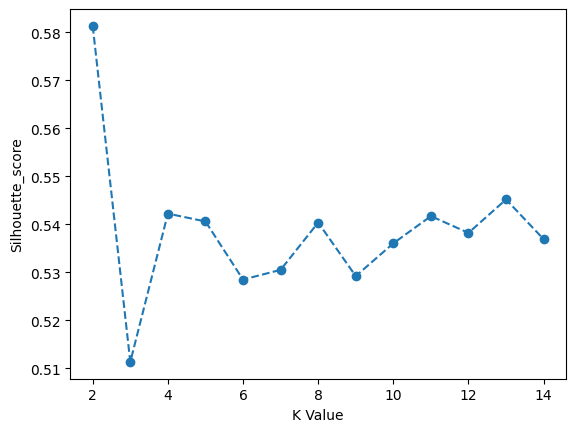

In [166]:
plt.plot(range(2,15),ssd1,'o--')
plt.xlabel("K Value")
plt.ylabel("Silhouette_score")

### K-means with data scaling

In [167]:
ssd = []
ssd1 = []

for k in range(2,15):

    model = KMeans(n_clusters=k)


    model.fit(df_cust_scaled_pca)

    ssd.append(model.inertia_)
    labels= model.fit_predict(df_cust_scaled_pca)

    silhouette=silhouette_score(df_cust_scaled_pca,labels)
    ssd1.append(silhouette)

Text(0, 0.5, ' Sum of Squared Distances')

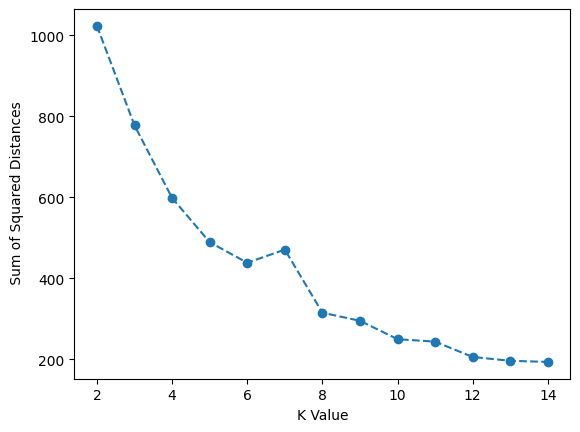

In [168]:
plt.plot(range(2,15),ssd,'o--')
plt.xlabel("K Value")
plt.ylabel(" Sum of Squared Distances")

Text(0, 0.5, 'Silhouette_score')

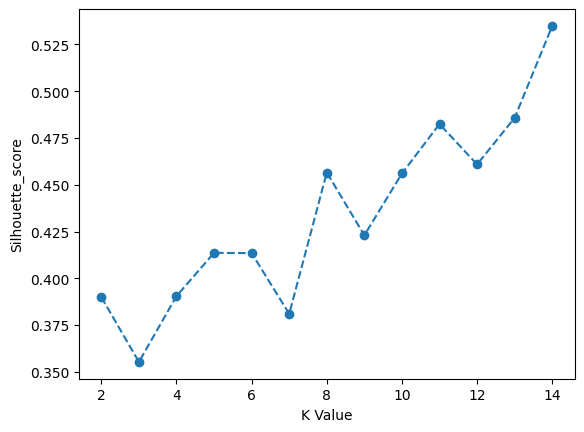

In [169]:
plt.plot(range(2,15),ssd1,'o--')
plt.xlabel("K Value")
plt.ylabel("Silhouette_score")

###1. In the previous graphs that illustrates the relation between Sum of Squared Distance and number of clusters, there is no clear elbow to determine the best number of clusters however we can consider 4 as number of clusters in the non scaled data since its silhouette value compared to k=2 (highest value) is not that big and also there is a kind of an elbow at k=4

###2. For the scaled data, even though there is not clear elbow but we can consider k=8 since its silhouette value is the highest peek before the overfitting occurs and the algorithm starts to cluster the outliers seperatly

## Agglomerative

### Agglomerative without data scaling

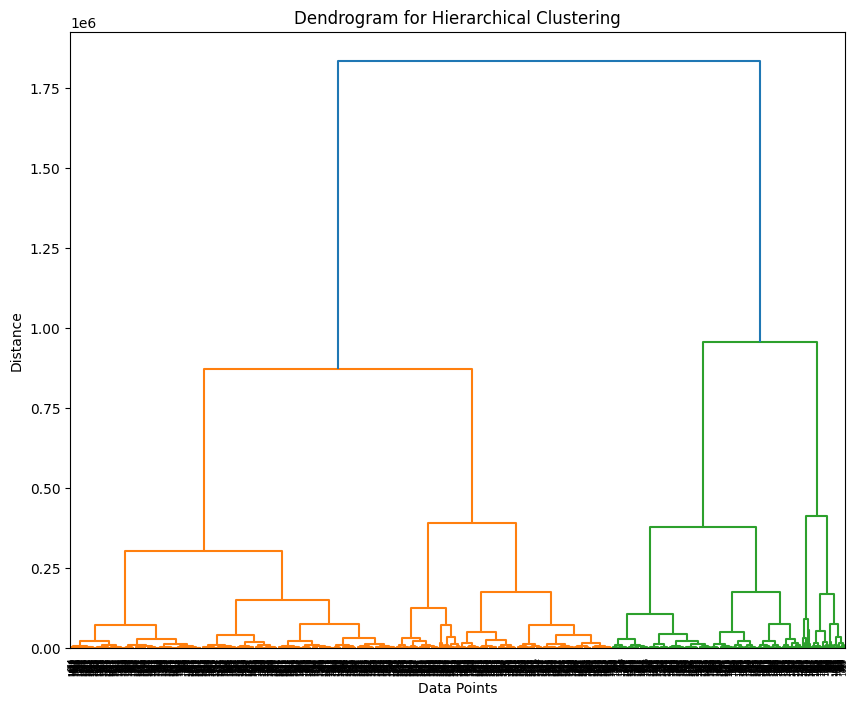

In [170]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(df_cust_pca, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

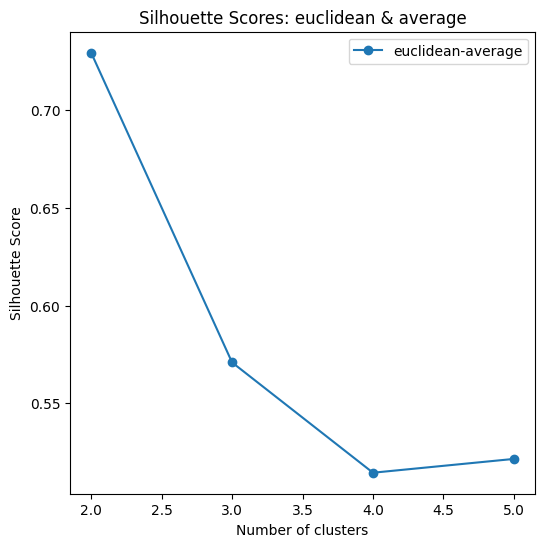

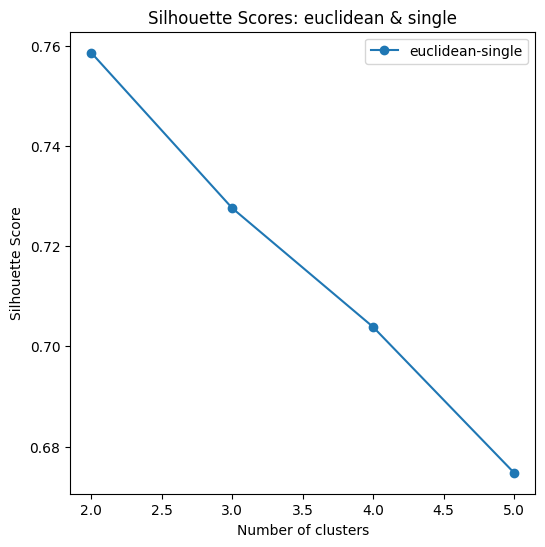

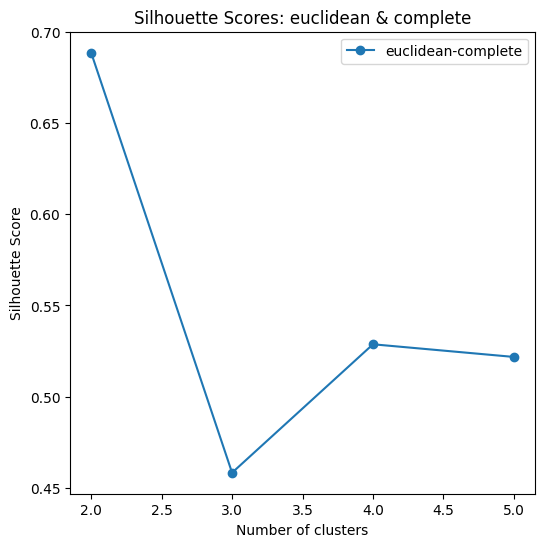

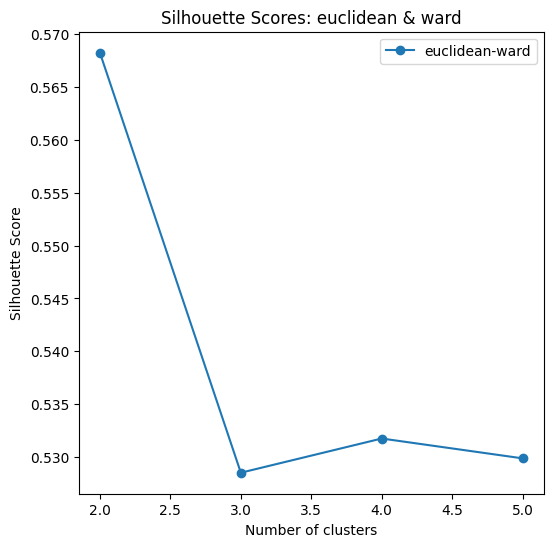

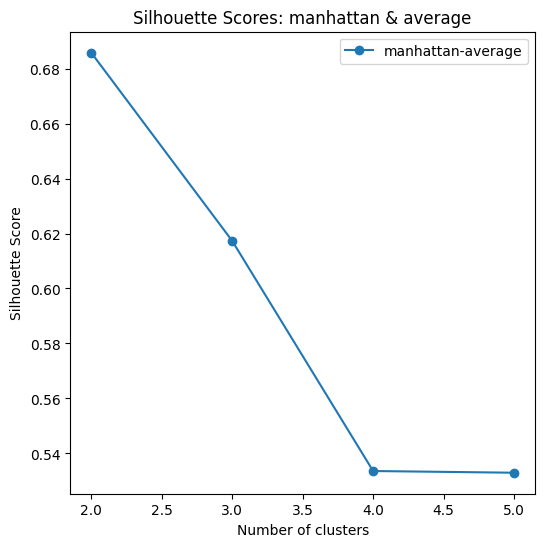

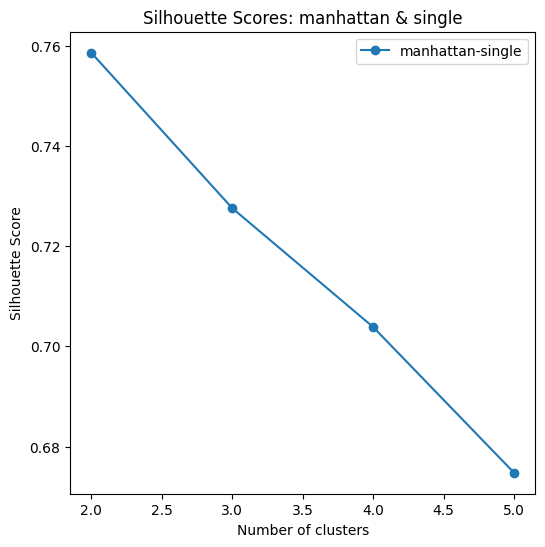

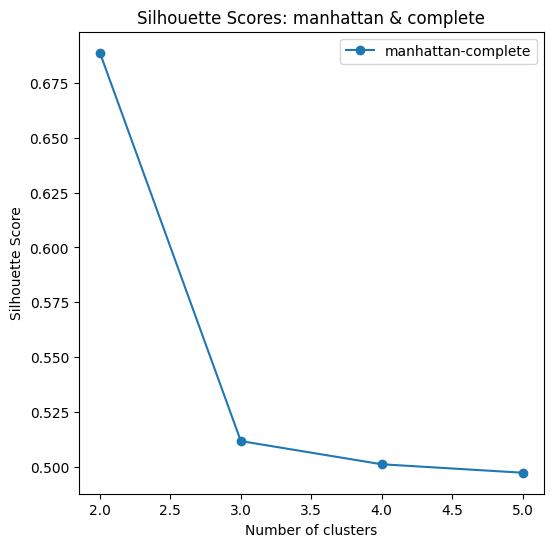

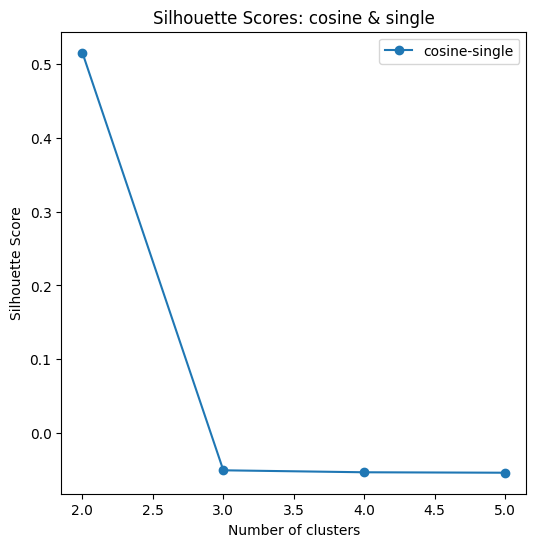

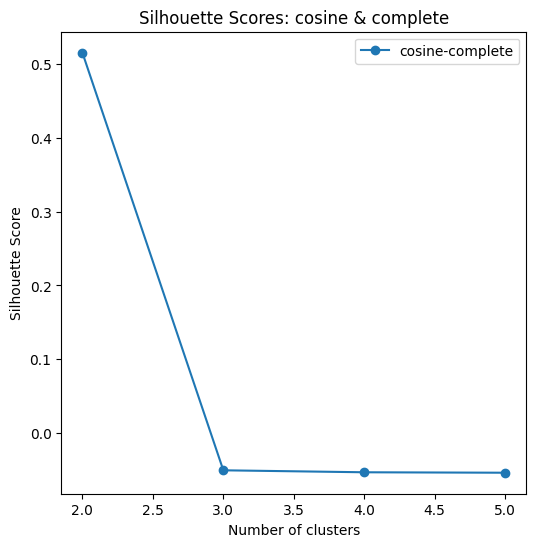

Best agglomerative clustering model for this data is number of clusters= 2 with linkage of single and affinity of euclidean. Silhouette Score is 0.758568225287424.


In [200]:
linkage_list = ["average", "single", "complete","ward"]
affinity_list = ["euclidean", "manhattan", "cosine"]
n = np.arange(2, 6)

best = -1
best_affinity = ""
best_n = 1
best_linkage = ""

for affinity in affinity_list:
    for linkage in linkage_list:
        s = []
        for n_clusters in n:
            if (linkage == "average" and affinity == "cosine"):
                continue
            if(linkage == "ward" and (affinity =="manhattan" or affinity =="cosine")):
                continue

            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage)
            model = model.fit(df_cust_pca)

            silhouette = silhouette_score(df_cust_pca, model.labels_)
            s.append(silhouette)

            if silhouette > best:
                best_n = n_clusters
                best = silhouette
                best_affinity = affinity
                best_linkage = linkage

        if s:
            plt.figure(figsize=(6,6))
            plt.plot(n, s, marker='o', linestyle='-', label=f"{affinity}-{linkage}")
            plt.xlabel("Number of clusters")
            plt.ylabel("Silhouette Score")
            plt.title(f"Silhouette Scores: {affinity} & {linkage}")
            plt.legend()
            plt.show()

print(f"Best agglomerative clustering model for this data is number of clusters= {best_n} "
      f"with linkage of {best_linkage} and affinity of {best_affinity}. "
      f"Silhouette Score is {best}.")

### Agglomerative with data scaling

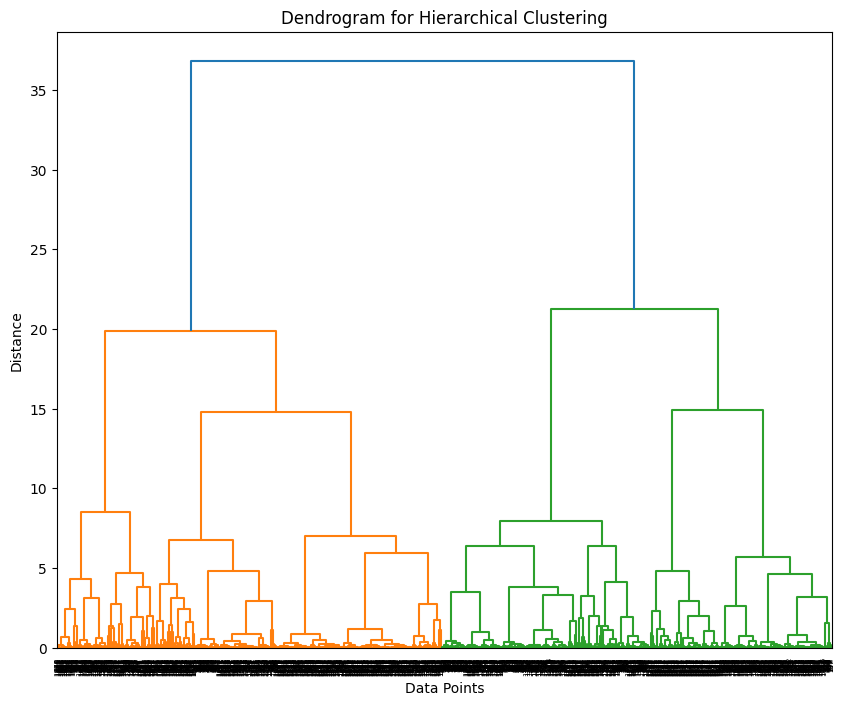

In [174]:
from scipy.cluster.hierarchy import dendrogram, linkage

linkage_matrix = linkage(df_cust_scaled_pca, method='ward')
plt.figure(figsize=(10, 8))
dendrogram(linkage_matrix)
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

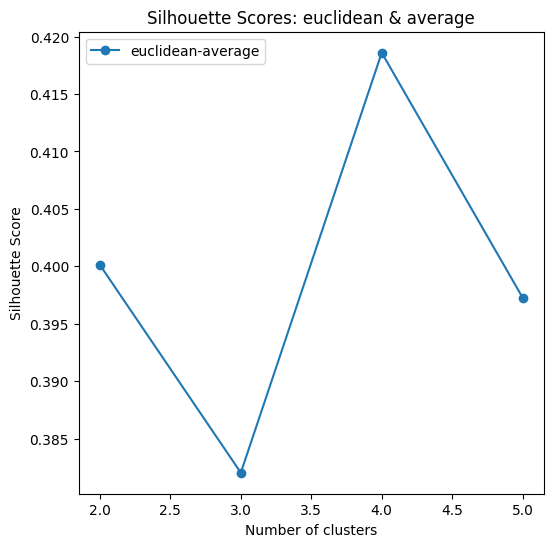

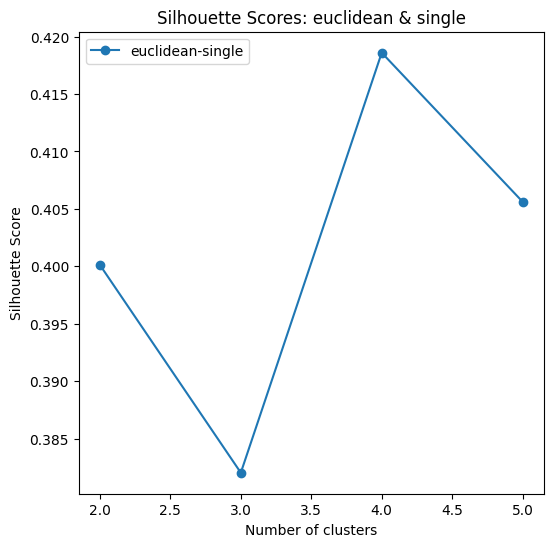

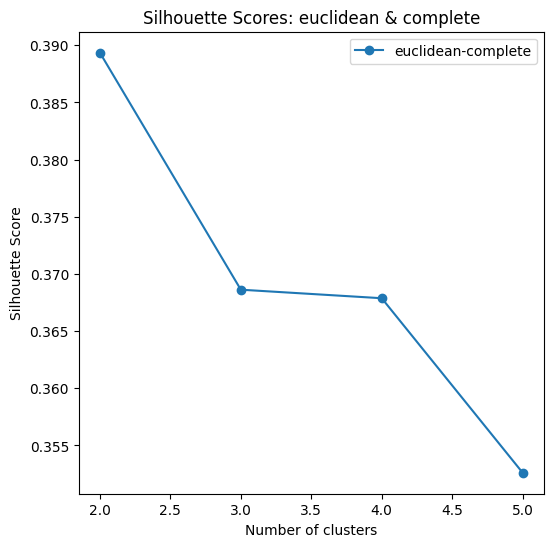

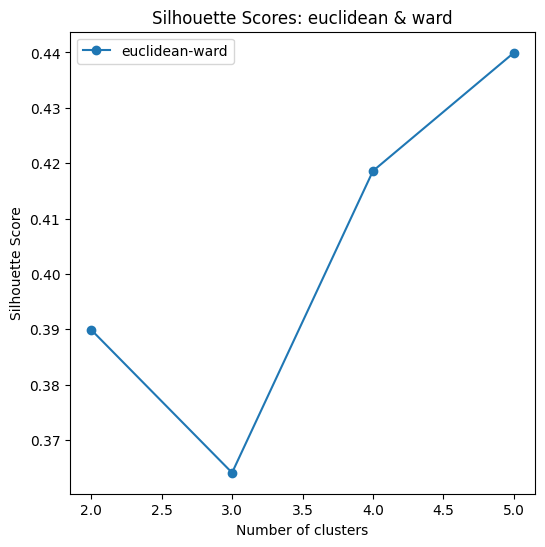

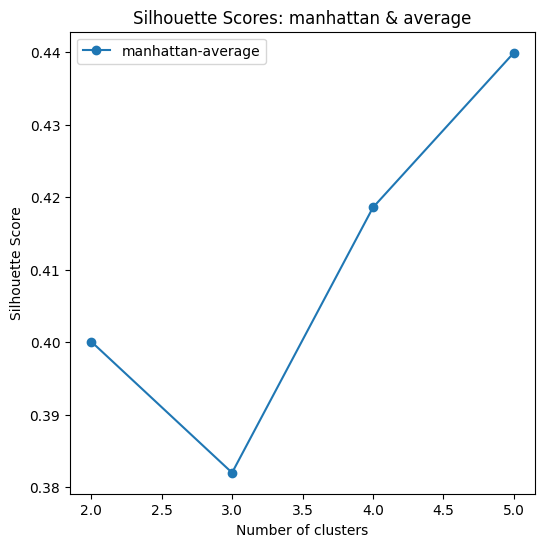

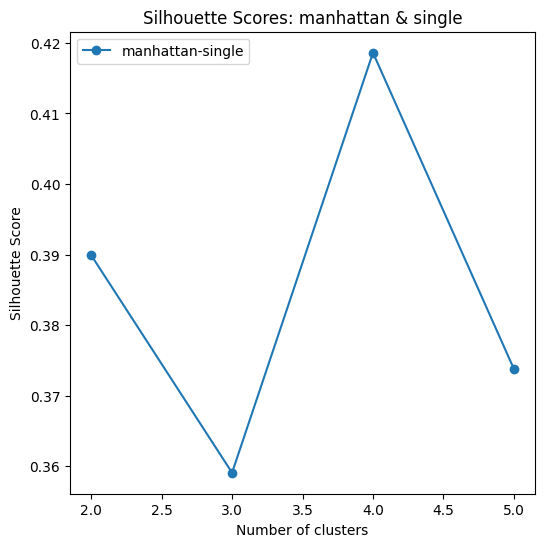

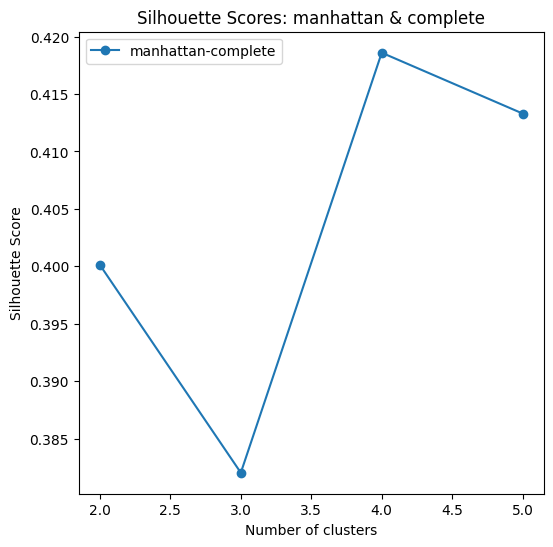

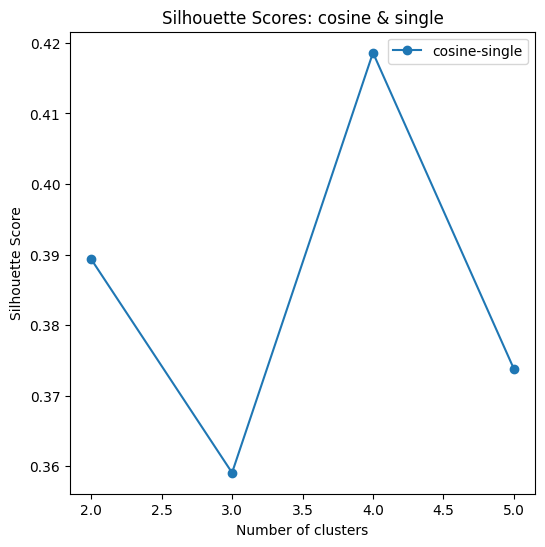

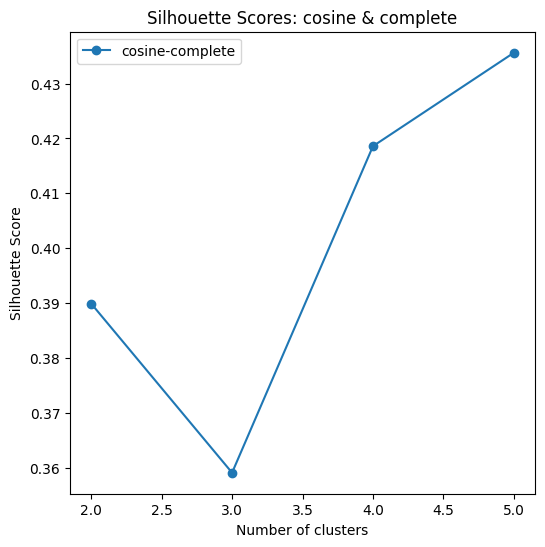

Best agglomerative clustering model for this data is number of clusters= 5 with linkage of ward and affinity of euclidean. Silhouette Score is 0.4399437858637109.


In [201]:
linkage_list = ["average", "single", "complete","ward"]
affinity_list = ["euclidean", "manhattan", "cosine"]
n = np.arange(2, 6)

best = -1
best_affinity = ""
best_n = 1
best_linkage = ""

for affinity in affinity_list:
    for linkage in linkage_list:
        s = []
        for n_clusters in n:
            if (linkage == "average" and affinity == "cosine"):
                continue
            if(linkage == "ward" and (affinity =="manhattan" or affinity =="cosine")):
                continue

            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage)
            model = model.fit(df_cust_scaled_pca)

            silhouette = silhouette_score(df_cust_scaled_pca, model.labels_)
            s.append(silhouette)

            if silhouette > best:
                best_n = n_clusters
                best = silhouette
                best_affinity = affinity
                best_linkage = linkage

        if s:
            plt.figure(figsize=(6,6))
            plt.plot(n, s, marker='o', linestyle='-', label=f"{affinity}-{linkage}")
            plt.xlabel("Number of clusters")
            plt.ylabel("Silhouette Score")
            plt.title(f"Silhouette Scores: {affinity} & {linkage}")
            plt.legend()
            plt.show()

print(f"Best agglomerative clustering model for this data is number of clusters= {best_n} "
      f"with linkage of {best_linkage} and affinity of {best_affinity}. "
      f"Silhouette Score is {best}.")

### 1. Best agglomerative clustering model without scaling is number of clusters= 2 with linkage of single and affinity of euclidean. Silhouette Score is 0.76

### 2. Best agglomerative clustering model with scaling is number of clusters= 5 with linkage of ward and affinity of euclidean. Silhouette Score is 0.44


## DBSCAN

### DBSCAN without data scaling

Best DBScan clustering model for this data with epsilon 0.1 and min samples 5 has silhouette score -1 with number of clusters equal to 1


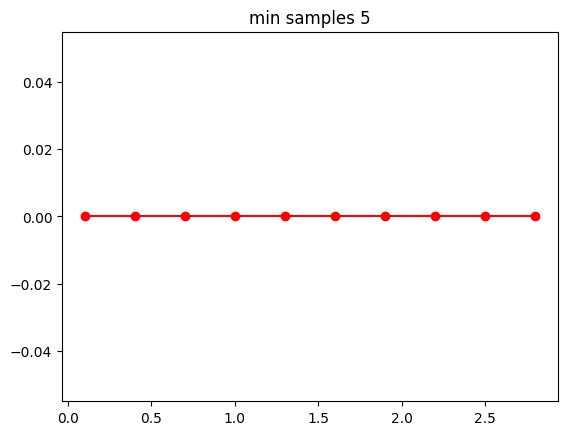

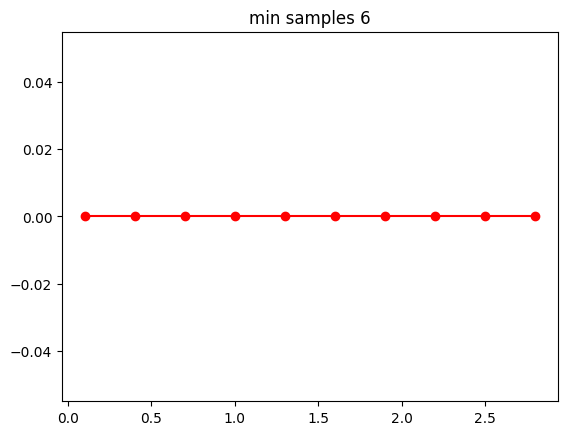

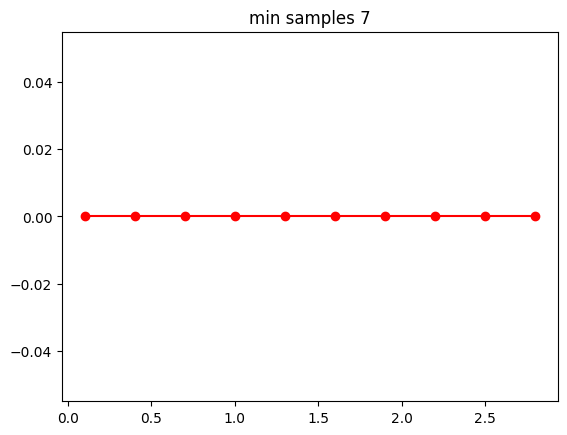

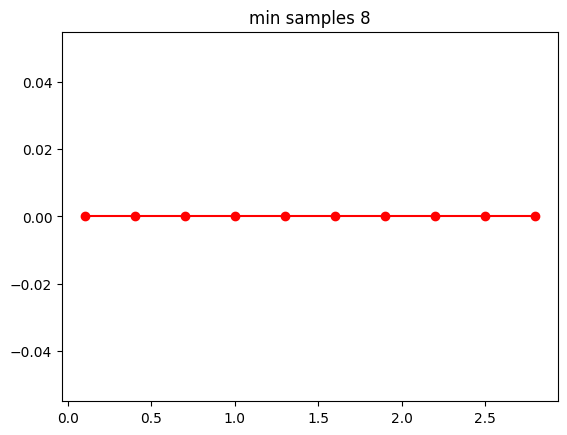

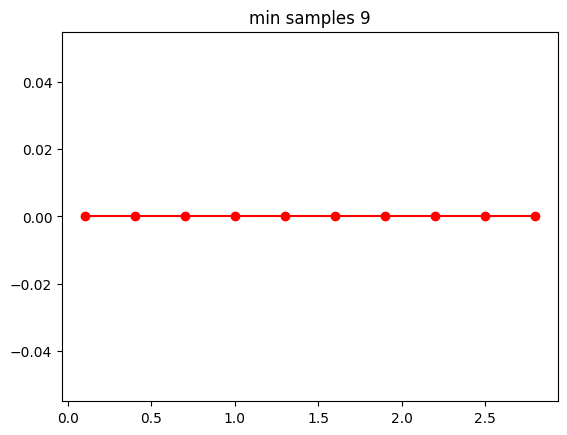

...

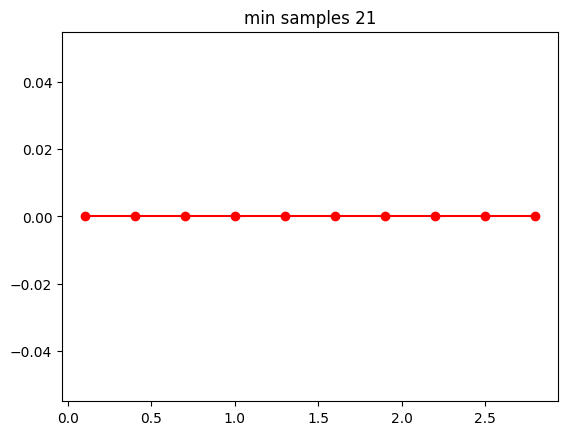

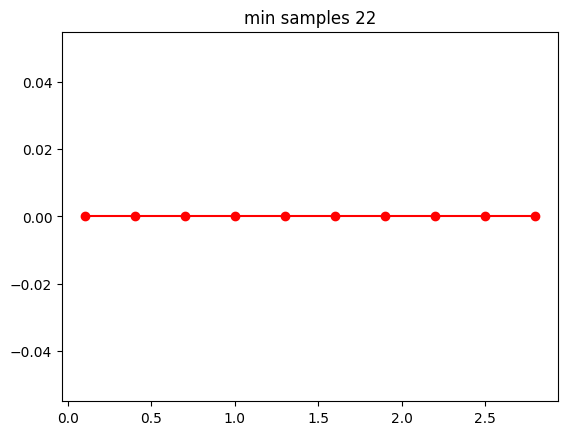

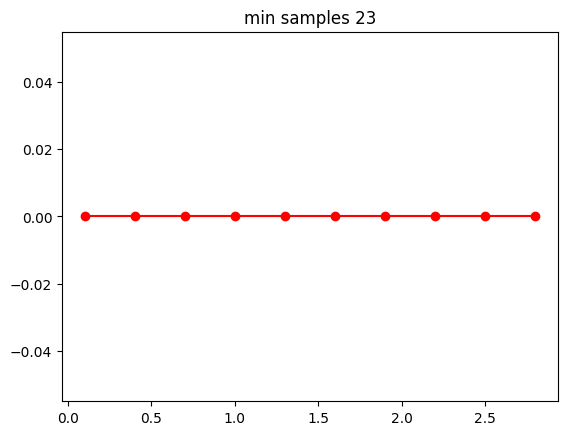

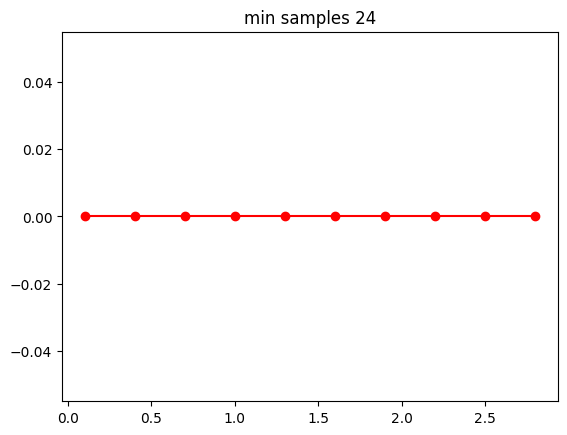

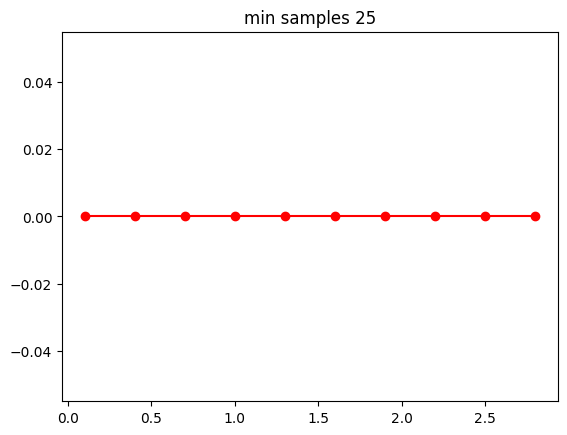

In [176]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

best_n_clusters=1
best_eps=0.1
best_min=5
best_s=-1
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.3):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_cust_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_cust_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters=len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.3), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} with number of clusters equal to {best_n_clusters}")


### DBSCAN with data scaling

Best DBScan clustering model for this data with epsilon 0.1 and min samples 5 has silhouette score 0.7191871089367805 with number of clusters equal to 52


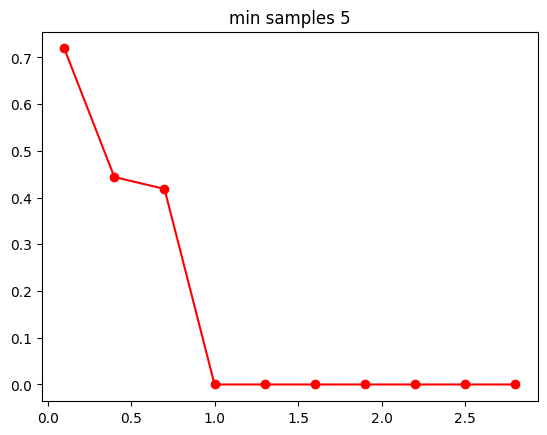

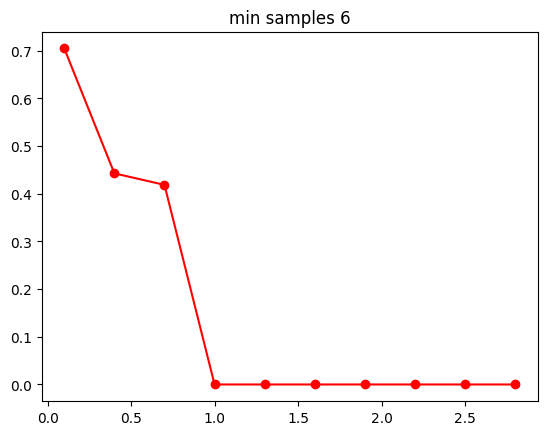

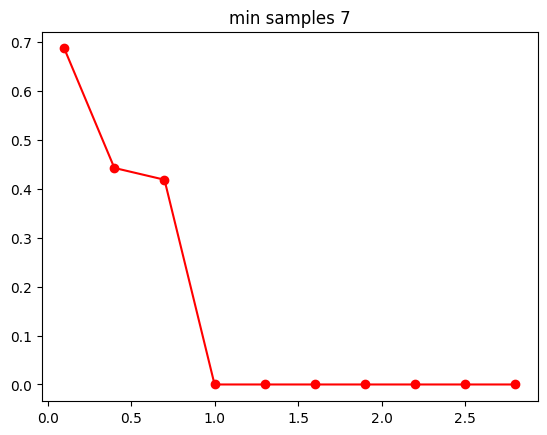

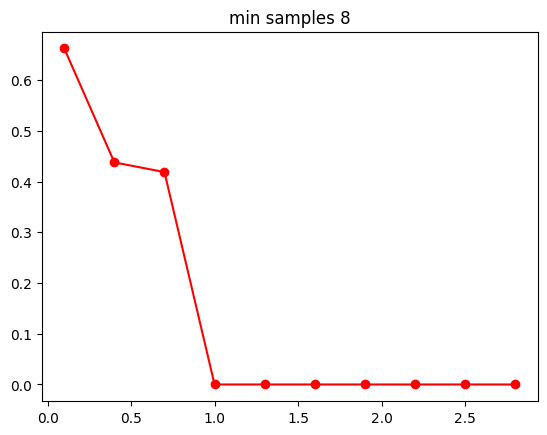

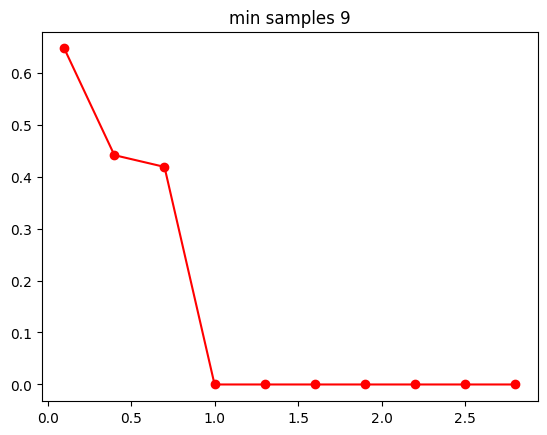

...

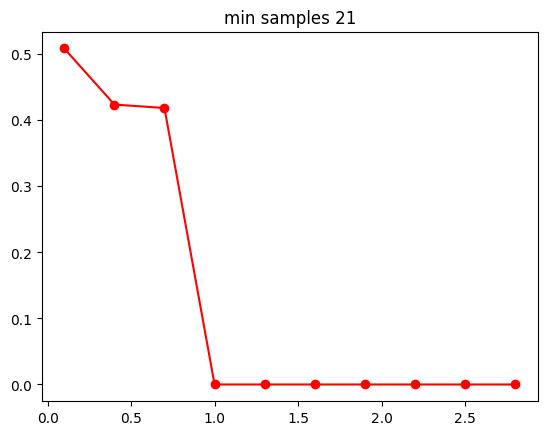

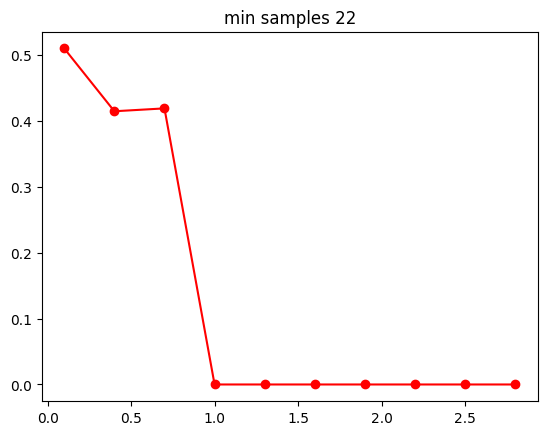

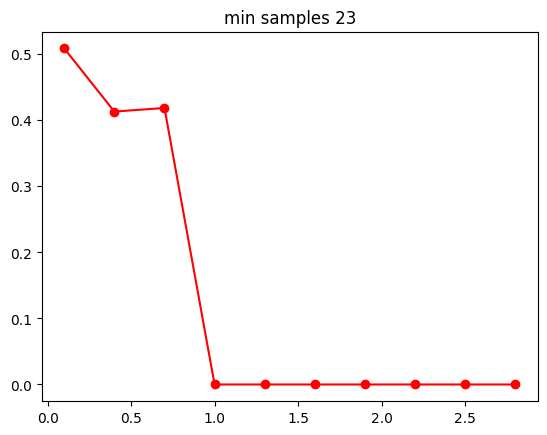

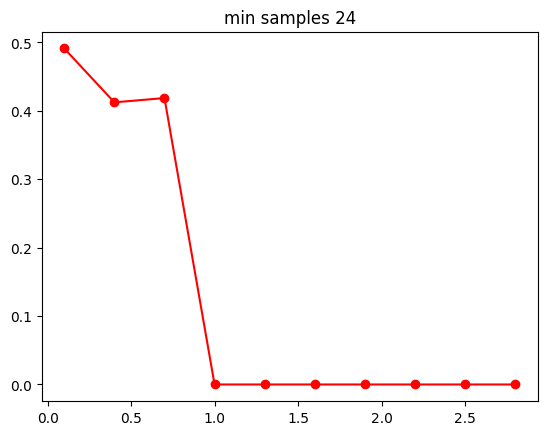

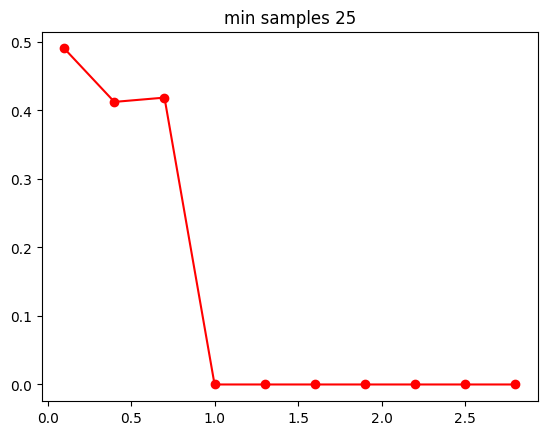

In [177]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

best_n_clusters=1
best_eps=0.1
best_min=5
best_s=-1
for i in range(5,26):
  s = []
  for j in np.arange(0.1, 3, 0.3):
    dbscan = DBSCAN(eps=j, min_samples=i)
    cluster_labels = dbscan.fit_predict(df_cust_scaled_pca)
    if len(np.unique(cluster_labels)) == 1:
      silhouette = 0
      s.append(silhouette)
      continue
    silhouette = silhouette_score(df_cust_scaled_pca, cluster_labels)
    s.append(silhouette)
    if silhouette > best_s:
      best_eps=j
      best_min=i
      best_s=silhouette
      best_n_clusters=len(np.unique(cluster_labels))
  plt.figure()
  plt.title(f"min samples {i}")
  plt.plot(np.arange(0.1, 3, 0.3), s, marker='o', color='red')

print(f"Best DBScan clustering model for this data with epsilon {best_eps} and min samples {best_min} has silhouette score {best_s} with number of clusters equal to {best_n_clusters}")


### 1. Best DBScan clustering model without scaling with epsilon 0.1 and min samples 5 has silhouette score -1 with number of clusters equal to 1 which means that it clustered all data into one cluster so the algorithm failed and it gave -1 since we can not calculate silhouette score while havin 1 cluster

###2. Best DBScan clustering model with scaling with epsilon 0.1 and min samples 5 has silhouette score 0.72 with number of clusters equal to 52 which means that the algorithms created clusters for the outliers and this can lead to overfitting


###3. In case the data was not scaled, since k=1 so the silhouette score can not be calculated in this case so this's why we have the value of -1. When it is scaled it gave an unreasonable value for number of cluster =49 even though the silhouette score is better

###4. So the DBSCAN failed to cluster the data either with or without scaling


### We conclude that Agglomerative with the scaled dataset is the best clustering technique in this case, it gave 5 clusters with the highest silhouette score of 0.76 compared the k-means that gave more clusters and lower silhouette value and DBScan which failed to cluster the data